In [5]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas_profiling
%matplotlib inline

# Importation des tables et tailles

In [4]:
custumer = pd.read_csv('olist_customers_dataset.csv')
geolocation = pd.read_csv('olist_geolocation_dataset.csv')
items = pd.read_csv('olist_order_items_dataset.csv')
paiement = pd.read_csv('olist_order_payments_dataset.csv')
review = pd.read_csv('olist_order_reviews_dataset.csv')
dataset = pd.read_csv('olist_orders_dataset.csv')
produit = pd.read_csv('olist_products_dataset.csv')
sellers = pd.read_csv('olist_sellers_dataset.csv')
category = pd.read_csv('product_category_name_translation.csv')

In [4]:
liste_df = {'clients': custumer, 'localisation': geolocation, 'articles': items,
            'paiement': paiement, 'avis': review, 'base': dataset, 'produit': produit,
            'vendeur': sellers, 'traduction produit': category}

In [4]:
#pour regarder la taille
for i, j in liste_df.items():

    print('{} dataframe:      {} rows and {} columns'.format(
        str(i), j.shape[0], j.shape[1]))
    print(list(j.columns))
    print("")
print("________________________________________________________________________________________________")

clients dataframe:      99441 rows and 5 columns
['customer_id', 'customer_unique_id', 'customer_zip_code_prefix', 'customer_city', 'customer_state']

localisation dataframe:      1000163 rows and 5 columns
['geolocation_zip_code_prefix', 'geolocation_lat', 'geolocation_lng', 'geolocation_city', 'geolocation_state']

articles dataframe:      112650 rows and 7 columns
['order_id', 'order_item_id', 'product_id', 'seller_id', 'shipping_limit_date', 'price', 'freight_value']

paiement dataframe:      103886 rows and 5 columns
['order_id', 'payment_sequential', 'payment_type', 'payment_installments', 'payment_value']

avis dataframe:      100000 rows and 7 columns
['review_id', 'order_id', 'review_score', 'review_comment_title', 'review_comment_message', 'review_creation_date', 'review_answer_timestamp']

base dataframe:      99441 rows and 8 columns
['order_id', 'customer_id', 'order_status', 'order_purchase_timestamp', 'order_approved_at', 'order_delivered_carrier_date', 'order_delivered_

In [5]:
liste_df = [custumer, geolocation, items,
            paiement, review, dataset, produit,
            sellers, category]

In [6]:
for df in liste_df:
    print(df.duplicated().sum())
# on va regarder sil ya des lignes doubles
# on a juste la base geolocation qui a des lignes en double

0
261831
0
0
0
0
0
0
0


In [7]:
for df in liste_df:
    print(df.isna().sum().sum())
# nous voyons que le dataframe review dataset produit ont des valeurs manquantes

0
0
0
0
146532
4908
2448
0
0


# Fonctions

In [18]:
# fonction qui donne le taux de remplissage et nous dit les colonnes vides
# nous renseigne aussi le taux de remplissage
# le taux de valeurs manquantes
def TraceValeurMissing(base):

    col_vides = []
    for col in base.columns:
        if base[col].isnull().all():
          # all Renvoie True si au moins
          # un élément de iterable est vrai. False est renvoyé dans
          # le cas où iterable est vide
            col_vides.append(col)
    print('les colonnes vides sont:\n\n')
    display(col_vides)  # affiche tete de table
    t = pd.DataFrame(index=['number of missing values',
                     'number of values', 'fill_rate'], columns=base.columns)
    for col in base.columns:
        nb_nan = base[col].isnull().sum()
        t.loc['number of missing values', col] = nb_nan
        t.loc['number of values', col] = base.shape[0]-nb_nan
        t.loc['fill_rate', col] = (base.shape[0]-nb_nan)/(base.shape[0]*1.0)
        # taux de remplissage
    display(t)  # pd.set
    dico = {'columns': base.columns, 'fill_rate': (
        t.loc['fill_rate', base.columns]*100), 'missing_values': (100-t.loc['fill_rate', base.columns]*100)}
    tr = pd.DataFrame(dico)
    tr = tr.sort_values(by='fill_rate', ascending=False)  # trier le tableau
    barWidth = 0.85  # largeur des barres
    plt.figure(figsize=(8, 10))
    plt.gca().invert_yaxis()  # pour creer des axes polaires valeur d'une graduation
    # taille des graduations
# plt.barh creation dune barre horizontale
    plt.barh(tr['columns'], tr['fill_rate'], color='#a3acff')
    plt.barh(tr['columns'], tr['missing_values'],
             left=tr['fill_rate'], color='#b5ffb9')
    plt.title('Taux de remplissage', fontsize=30)
    plt.yticks(fontsize=10)
    plt.ylabel('columns', fontdict={'fontsize': 20})
    plt.xlabel('fill rate(%)', fontdict={'fontsize': 20})

    plt.axvline(x=80, color='b')
    plt.text(82, -1, '>80%', color='b')
    plt.axvline(x=20, color='r')
    plt.text(12, -1, '<20%', color='r')
    plt.axvline(x=50, color='g')
    plt.text(50, -1, '>50%', color='b')
    plt.grid(True)

In [19]:
# fonction qui calcule le nombre de pourcentage de valeur manquante
def Missing(Base):
    PVm = ((Base.isnull().sum())/Base.shape[0])*100
    PVm.sort_values(ascending=True)
    return PVm

In [20]:
# creation d'une fonction qui prend toutes les variables dont le
# % de valeurs manquantes est inferieur à un nombre qu on sest fixe
# ici 95 %
def Suppression(Base, pourcentage):
    ValM = ((Base.isnull().sum())/Base.shape[0])*100
    Base = Base.loc[:, ValM <= pourcentage]
    return Base

In [21]:
# fonction qui permet de choisir une base la colonne qui nous dit le nombre
# de doublons et qui les supprimes
def Doublons(Base, colonne):
    d = Base.duplicated(subset=colonne).sum()
    print('Vous avez {} doublons pour cette variable {}'.format(d, colonne))
    lignes = Base.shape[0]-d
    NBase = Base.drop_duplicates(subset=colonne)
    print('Il vous restent {} lignes de votre Dataframe'.format(lignes))
    return NBase

In [22]:
# fonction qui calcule les outliers ou l'utilisateur choisit son
# ecart 1.5,3 ou 5
# il nous retourne les index les valeurs
# en entree il nous donne le nom de la colonne
def CalculOutlier(v):
    ecart = input('Donnez votre écart = ')
    ecart = float(ecart)  # conversion de ecart en float
    # cette fonction nous donne les index et valeurs des valeurs aberrantes
    # le nom de la colonne
    Q1 = v.quantile(0.25)
    Q3 = v.quantile(0.75)
    EIQ = Q3-Q1
    LI = Q1-ecart*EIQ
    LS = Q3+ecart*EIQ
    i = list(v.index[(v < LI) | (v > LS)])
    val = list(v[i])
    print('Voila votre résultat pour un ecart interquartile de {}'.format(ecart))
    return i, val

In [23]:
def TraceGraphique(Base, colonne):
    plt.figure(figsize=(20, 10))
    sns.boxplot(data=Base, x=colonne)
    plt.title('Dispersion de la variable {}'.format(colonne))
    sns.displot(data=Base, x=colonne, bins=20, kde=True)
    plt.title('Dispersion de la variable {}'.format(colonne))

In [24]:
def Trace_Box(base, quantitative, qualitative):
    # on veut savoir si une variable qualitative va influencer

    plt.figure(figsize=(8, 8))
    ax = sns.boxplot(x=qualitative, y=quantitative,
                     data=base.sort_values([qualitative]))

    plt.show()

# Table CUSTOMER

In [25]:
custumer.head(5)  # il contient 99441 lignes et 5 colonnes
# nous avons 99441 clients
# informations sur le client et son emplacement
# customer_id est l'identifiant unique dune commande
# customer_unique_id est l'identifiant unique d'un client
# customer zip les 5 chiffres du code postal
# customer city nom de la ville du client
# customer state etat du client

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


## Missing

In [13]:
custumer.isna().sum()
#aucune feature n'a de valeur manquante 

customer_id                 0
customer_unique_id          0
customer_zip_code_prefix    0
customer_city               0
customer_state              0
dtype: int64

## Exploration 

In [14]:
custumer.dtypes

customer_id                 object
customer_unique_id          object
customer_zip_code_prefix     int64
customer_city               object
customer_state              object
dtype: object

In [15]:
custumer.customer_city.unique().shape
#nous avons 4119 villes 

(4119,)

In [16]:
custumer.customer_state.unique()
#27 états 

array(['SP', 'SC', 'MG', 'PR', 'RJ', 'RS', 'PA', 'GO', 'ES', 'BA', 'MA',
       'MS', 'CE', 'DF', 'RN', 'PE', 'MT', 'AM', 'AP', 'AL', 'RO', 'PB',
       'TO', 'PI', 'AC', 'SE', 'RR'], dtype=object)

### Etats

In [6]:
df=pd.DataFrame({'Modalite':custumer['customer_state'].value_counts().index,'effectif': custumer['customer_state'].value_counts().values})

Text(0.5, 1.0, '42% de nos clients se trouvent à Sao Paulo')

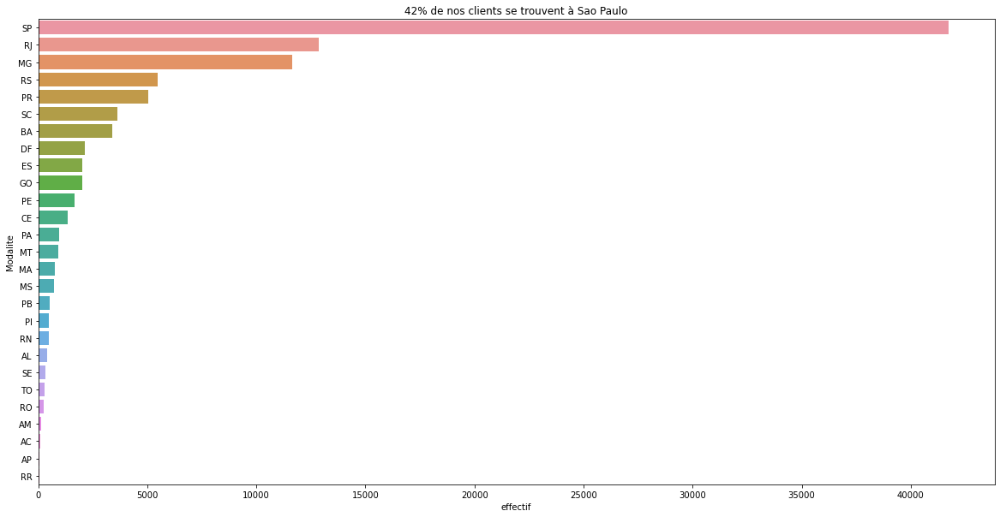

In [7]:
plt.figure(figsize=(20,10))
sns.barplot(y='Modalite',x='effectif',data=df.sort_values('effectif',ascending=False))
plt.title('42% de nos clients se trouvent à Sao Paulo')

### Villes 

In [19]:
pd.set_option('display.max_row',100)
custumer.customer_city.value_counts().head(10)

sao paulo                15540
rio de janeiro            6882
belo horizonte            2773
brasilia                  2131
curitiba                  1521
campinas                  1444
porto alegre              1379
salvador                  1245
guarulhos                 1189
sao bernardo do campo      938
Name: customer_city, dtype: int64

In [9]:
ville = custumer['customer_city'].value_counts(dropna=False)
modalites = ville.index  # modalites
tab = pd.DataFrame(modalites, columns=['customer_city'])
tab['effectif'] = ville.values  # effectif
tab['frequence'] = tab['effectif']/custumer.shape[0]
# tri selon les modalites
tab['Frequence cumulée'] = (tab['frequence'].cumsum())*100

In [10]:
tab.head(5)
#la ville de Sau paulo est la plus présente suivi de rio janeiro


,customer_city,effectif,frequence,Frequence cumulée
0,sao paulo,15540,0.156274,15.627357
1,rio de janeiro,6882,0.069207,22.548044
2,belo horizonte,2773,0.027886,25.336632
3,brasilia,2131,0.021430,27.479611
4,curitiba,1521,0.015296,29.009161


Text(0.5, 1.0, 'La pluspart des clients commandent à Sao Paulo')

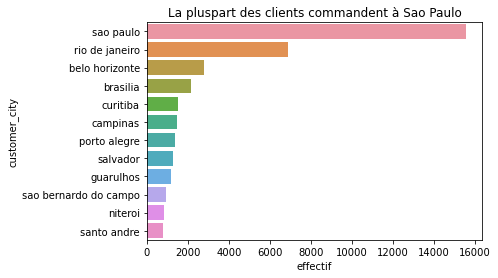

In [11]:
d=tab.loc[0:11,['customer_city','effectif','frequence']]
plt.figure()
sns.barplot(y='customer_city',x='effectif',data=d.sort_values('effectif',ascending=False))
plt.title('La pluspart des clients commandent à Sao Paulo')

### Doublons

In [12]:
custumer.shape

(99441, 5)

In [24]:
custumer.customer_id.unique().shape
#nous avons 99441 commandes 

(99441,)

In [26]:
custumer.customer_unique_id.unique().shape
#nous avons 96096 clients 

(96096,)

In [13]:
custumer.duplicated(subset='customer_unique_id').sum()
#nous avons 3345 clients qui sont en doublons 
#ca veut dire que nous avonsz 3345 clients qui ont commandes plusieurs fois  

3345

In [27]:
i=custumer['customer_unique_id']=='b6c083700ca8c135ba9f0f132930d4e8'
sum(i)
#ce client a passe deux commandes

2

In [28]:
custumer.dtypes

customer_id                 object
customer_unique_id          object
customer_zip_code_prefix     int64
customer_city               object
customer_state              object
dtype: object

In [29]:
i=custumer['customer_unique_id']=='a40096fc0a3862e9e12bc55b5f8e6ab2'
sum(i)

3

In [34]:
j=custumer.duplicated(subset='customer_unique_id')==True
custumer[j].head(5)

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
679,c57b4b6f3719475543b721e720a526ad,b6c083700ca8c135ba9f0f132930d4e8,8686,suzano,SP
1463,9f6f3da49e2d46e3a7529f5e3c25ecce,a40096fc0a3862e9e12bc55b5f8e6ab2,20561,rio de janeiro,RJ
1607,299f7b5125c8fbe1761a1b320c34fc7d,b8b3c435a58aebd788a477bed8342910,95585,arroio do sal,RS
2811,226d59f9f4b98e228b689eea45d03a6d,66980c3775537536f77b434d74e520f5,30290,belo horizonte,MG
3198,b1253701171dfb298f52a221f824e45b,788313d21c3507fe890921f6e17aa679,11070,santos,SP


In [36]:
custumer.describe(include='O')

,customer_id,customer_unique_id,customer_city,customer_state
count,99441,99441,99441,99441
unique,99441,96096,4119,27
top,0576e04c11f1cca61cc2975f5fd83179,8d50f5eadf50201ccdcedfb9e2ac8455,sao paulo,SP
freq,1,17,15540,41746


#  Table LOCALISATION

In [37]:
geolocation.shape

(1000163, 5)

In [38]:
geolocation.head(2)#10000163 lignes et 5 colonnes 
#information sur les codes postaux de brazil
#ces cordonnées gps 
#permet de regarder les distances entre les vendeurs et clients 

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP


In [15]:
j=geolocation.duplicated()==True
#nous avons 261831 lignes en doubles
#nous allons les supprimer 
geolocation[j]

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
15,1046,-23.546081,-46.644820,sao paulo,SP
44,1046,-23.546081,-46.644820,sao paulo,SP
65,1046,-23.546081,-46.644820,sao paulo,SP
66,1009,-23.546935,-46.636588,sao paulo,SP
67,1046,-23.546081,-46.644820,sao paulo,SP
...,...,...,...,...,...
1000153,99970,-28.343273,-51.873734,ciriaco,RS
1000154,99950,-28.070493,-52.011342,tapejara,RS
1000159,99900,-27.877125,-52.224882,getulio vargas,RS
1000160,99950,-28.071855,-52.014716,tapejara,RS


In [16]:
geolocation=geolocation.drop_duplicates()

In [17]:
geolocation.shape

(738332, 5)

In [18]:
geolocation['geolocation_city'].unique().shape

(8011,)

In [35]:
geolocation['geolocation_city'].value_counts().head(5)

sao paulo         79927
rio de janeiro    35177
são paulo         19718
belo horizonte    19474
curitiba          11263
Name: geolocation_city, dtype: int64

## Missing

In [36]:
geolocation.isna().sum().sum()

0

## Exploration

In [37]:
geolocation.dtypes

geolocation_zip_code_prefix      int64
geolocation_lat                float64
geolocation_lng                float64
geolocation_city                object
geolocation_state               object
dtype: object

### Villes 

In [38]:
d=geolocation.geolocation_city.unique()
#for e in len(geolocation.geolocation_city.unique()):
liste=[]
for i in range(len(d)):
    liste.append(d[i])
    df=pd.DataFrame(liste,columns=['Ville'])
    

#df.to_csv('ville.csv')

In [40]:
geolocation.loc[geolocation['geolocation_city'] ==
                'são paulo', 'geolocation_city'] = 'sao paulo'

In [41]:
geolocation.loc[geolocation['geolocation_city']=='sp','geolocation_city']='sao paulo'

In [42]:
geolocation.loc[geolocation['geolocation_city']=='sãopaulo','geolocation_city'] = 'sao paulo'

In [43]:
geolocation.loc[geolocation['geolocation_city']=='sa£o paulo','geolocation_city']= 'sao paulo'

In [44]:
geolocation.loc[geolocation['geolocation_city']=='são lourenço da serra','geolocation_city'] = 'sao lourenco da serra'

In [45]:
geolocation.loc[geolocation['geolocation_city'] == 'embu-guaçu','geolocation_city'] = 'embu-guacu'

In [46]:
geolocation.loc[geolocation['geolocation_city'] == 'embu-guaçu','geolocation_city'] ='embu-guacu'

In [47]:
geolocation.loc[geolocation['geolocation_city'] =='embu guaçu','geolocation_city'] ='embu-guacu'

In [48]:
geolocation.loc[geolocation['geolocation_city'] =='embu guaçu','geolocation_city'] ='embu-guacu'

In [49]:
geolocation['geolocation_city'].value_counts().head(5)

sao paulo         99651
rio de janeiro    35177
belo horizonte    19474
curitiba          11263
porto alegre       8702
Name: geolocation_city, dtype: int64

In [50]:
pd.set_option('display.max_row',100)
df.head(10)

,Ville
0,sao paulo
1,são paulo
2,sao bernardo do campo
3,jundiaí
4,taboão da serra
5,sãopaulo
6,sp
7,sa£o paulo
8,sao jose dos campos
9,osasco


In [51]:
geolocation.geolocation_city.unique()

array(['sao paulo', 'sao bernardo do campo', 'jundiaí', ..., 'ciríaco',
       'estação', 'vila lângaro'], dtype=object)

### Etats

In [52]:
geolocation.geolocation_state.unique().shape
#nous allons travailler sur les etats 

(27,)

#  Table ITEMS 

In [53]:
items.head(2) #(112650, 7)
#données qui representent les articles achetés sur chaque commande
#identifiant d'un article
#price le prix de larticle 
#identifiant du produit 
#identifiant du vendeur
#date limite expedition
#identifiant du produit et vendeur 

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.9,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.9,19.93


In [54]:
items.shape

(112650, 7)

In [55]:
items['product_id'].unique().shape
#identifiant produit nous avons 32951 produits dans notre site 

(32951,)

In [56]:
items.duplicated(subset='product_id').sum()
#79699 des produits ont ete vendus plusieurs fois 

79699

In [57]:
items['order_id'].unique().shape
#identifiant article nous avons 98666 articles dans notre site 

(98666,)

In [58]:
items.duplicated(subset='order_id').sum()
#13984 ont ete vendus plusieurs fois

13984

In [59]:
items.duplicated().sum()
#pas de ligne en doublons 

0

In [60]:
items.isna().sum()

order_id               0
order_item_id          0
product_id             0
seller_id              0
shipping_limit_date    0
price                  0
freight_value          0
dtype: int64

In [61]:
items.dtypes

order_id                object
order_item_id            int64
product_id              object
seller_id               object
shipping_limit_date     object
price                  float64
freight_value          float64
dtype: object

In [19]:
#transformation de la colonne shipping limit date en date
#c'est la date limite d'expedition
items['shipping_limit_date']=pd.to_datetime(items['shipping_limit_date'])

In [64]:
items.head(5)

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


In [82]:
items['order_item_id'].value_counts()
#nombre d'article inclus dans une commande 

1     98666
2      9803
3      2287
4       965
5       460
6       256
7        58
8        36
9        28
10       25
11       17
12       13
13        8
14        7
15        5
16        3
17        3
18        3
19        3
20        3
21        1
Name: order_item_id, dtype: int64

In [14]:
df0=pd.DataFrame({'Modalité':items['order_item_id'].value_counts().index,'Frequence':items['order_item_id'].value_counts().values})

In [15]:
df0['%']=items['order_item_id'].value_counts(normalize=True).values*100

In [16]:
df0

,Modalité,Frequence,%
0,1,98666,87.586329
1,2,9803,8.702175
2,3,2287,2.030182
3,4,965,0.856636
4,5,460,0.408344
5,6,256,0.227253
6,7,58,0.051487
7,8,36,0.031957
8,9,28,0.024856
9,10,25,0.022193


### Exploration

In [384]:
items.product_id.unique().shape
#nous avons 32951 produits 

(32951,)

In [385]:
items.seller_id.unique().shape
#nous avons 3095 vendeurs 

(3095,)

In [87]:
items.describe()
#on passe en moyenne le prix dun article est 120
#le plus petit prix dun article est de 0.85, le maximum est 6735
#la mediane est de 74.90, moyenne > mediane , la pluspart des données sont 
#superieur a la moyenne 

,order_item_id,price,freight_value
count,112650.000000,112650.000000,112650.000000
mean,1.197834,120.653739,19.990320
std,0.705124,183.633928,15.806405
min,1.000000,0.850000,0.000000
25%,1.000000,39.900000,13.080000
50%,1.000000,74.990000,16.260000
75%,1.000000,134.900000,21.150000
max,21.000000,6735.000000,409.680000


In [91]:
items.isna().sum()

order_id               0
order_item_id          0
product_id             0
seller_id              0
shipping_limit_date    0
price                  0
freight_value          0
dtype: int64

In [21]:
import scipy.stats as st
st.pearsonr(items['price'],items['freight_value'])[0]
#corrélation entre le prix et la valeur  du fret 

0.41420431036303496

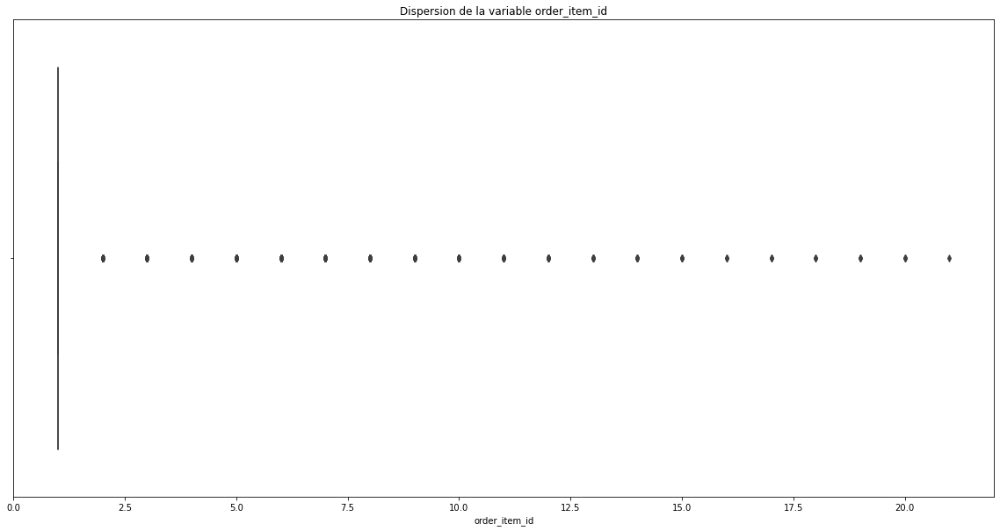

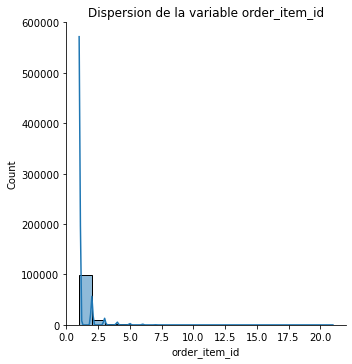

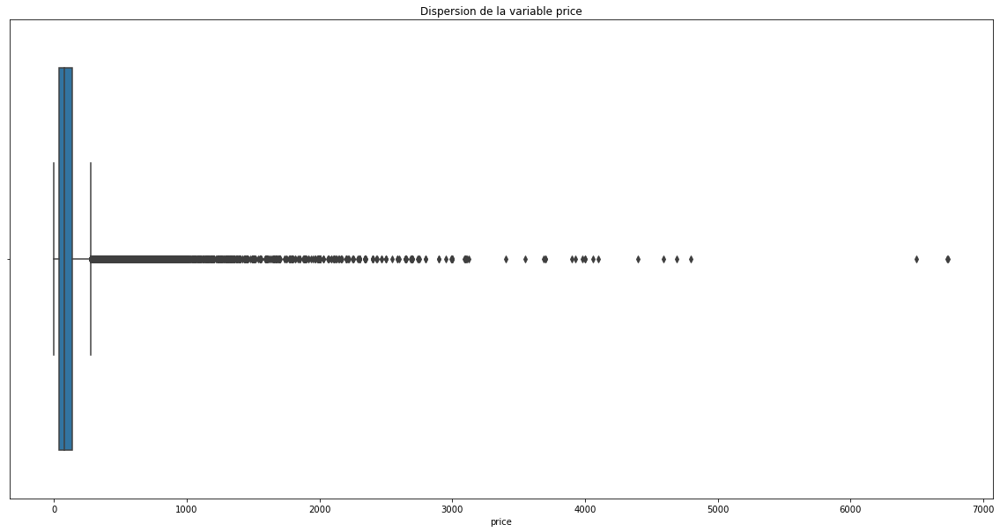

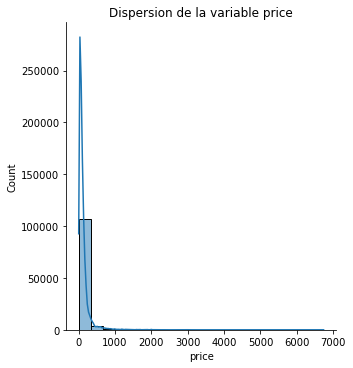

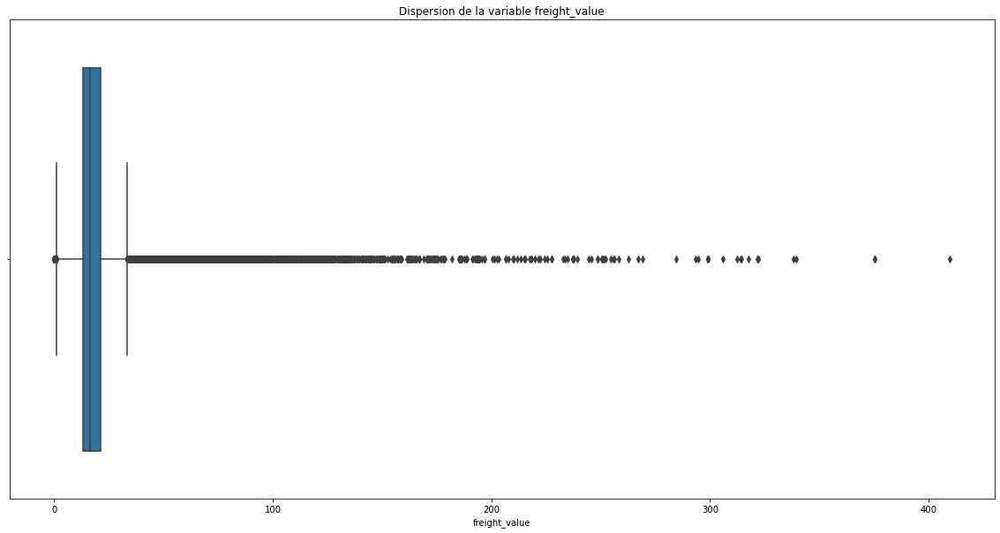

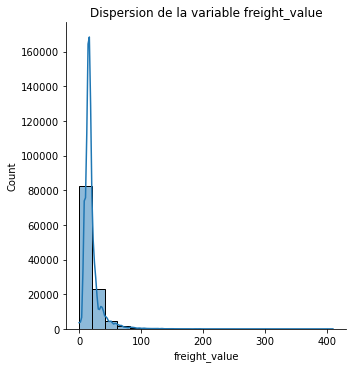

In [26]:
for col in items.select_dtypes(['float64','int64']).columns:
    TraceGraphique(items,col)

# Table PAIEMENT

In [69]:
paiement.head(5) #103886 lignes et 5 colonnes 
#order_id identifiant d'un article 
#informations sur les options de paiement 
#transaction valeur paiement 

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45


In [94]:
paiement.dtypes

order_id                 object
payment_sequential        int64
payment_type             object
payment_installments      int64
payment_value           float64
dtype: object

In [95]:
paiement.isna().sum().sum()

0

In [97]:
paiement.describe()
#la valeur dune transaction  est en moyenne 154 avec un minimum égal 0
#un max 13664 la moyenne superieur a la mediane
#la pluspart des données sont supérieurs à 154
#paiement sequential et paeiment installments variable quant discrete 


,payment_sequential,payment_installments,payment_value
count,103886.000000,103886.000000,103886.000000
mean,1.092679,2.853349,154.100380
std,0.706584,2.687051,217.494064
min,1.000000,0.000000,0.000000
25%,1.000000,1.000000,56.790000
50%,1.000000,1.000000,100.000000
75%,1.000000,4.000000,171.837500
max,29.000000,24.000000,13664.080000


In [389]:
paiement['payment_sequential'].value_counts()
#le mode de paiement
#la pluspart des clients choisisent un seul mode de paiement 

1     99360
2      3039
3       581
4       278
5       170
6       118
7        82
8        54
9        43
10       34
11       29
12       21
13       13
14       10
15        8
16        6
17        6
18        6
19        6
20        4
21        4
22        3
23        2
24        2
25        2
26        2
27        1
28        1
29        1
Name: payment_sequential, dtype: int64

In [390]:
i=paiement['payment_sequential']==29
#le client a paye avec 29 bon de promos 
paiement[i]

,order_id,payment_sequential,payment_type,payment_installments,payment_value
39108,fa65dad1b0e818e3ccc5cb0e39231352,29,voucher,1,19.26


In [391]:
i=paiement['payment_sequential']==28
#le client a paye avec 28 bon de promos 
paiement[i]

,order_id,payment_sequential,payment_type,payment_installments,payment_value
39111,fa65dad1b0e818e3ccc5cb0e39231352,28,voucher,1,29.05


In [392]:
i=paiement['payment_sequential']==27
#le client a paye avec plussieurs bon de promos 
paiement[i]

,order_id,payment_sequential,payment_type,payment_installments,payment_value
4885,fa65dad1b0e818e3ccc5cb0e39231352,27,voucher,1,66.02


In [393]:
paiement['payment_installments'].value_counts()
#la pluspart de nos clients choisissent des versements de 1 a 9 fois 

1     52546
2     12413
3     10461
4      7098
10     5328
5      5239
8      4268
6      3920
7      1626
9       644
12      133
15       74
18       27
11       23
24       18
20       17
13       16
14       15
17        8
16        5
21        3
0         2
22        1
23        1
Name: payment_installments, dtype: int64

In [70]:
i=paiement['payment_installments']==23
paiement[i]

,order_id,payment_sequential,payment_type,payment_installments,payment_value
89969,657092a7391a08ae27775a441765b3bc,1,credit_card,23,236.48


In [71]:
i=paiement['payment_installments']==22
paiement[i]

,order_id,payment_sequential,payment_type,payment_installments,payment_value
18956,ef00af19f3e4667ac596baf6656e0ee4,1,credit_card,22,228.71


In [72]:
i=paiement['payment_installments']==0
paiement[i]

,order_id,payment_sequential,payment_type,payment_installments,payment_value
46982,744bade1fcf9ff3f31d860ace076d422,2,credit_card,0,58.69
79014,1a57108394169c0b47d8f876acc9ba2d,2,credit_card,0,129.94


In [23]:
i=paiement['payment_installments']==0
paiement[i].index
#nous allons supprimer ces deux individus 

Int64Index([46982, 79014], dtype='int64')

In [24]:
paiement.shape

(103886, 5)

In [25]:
paiement=paiement.drop(index=paiement[i].index)

In [26]:
paiement.shape

(103884, 5)

In [77]:
i=paiement['payment_value']==13664.080000
paiement[i]

,order_id,payment_sequential,payment_type,payment_installments,payment_value
52107,03caa2c082116e1d31e67e9ae3700499,1,credit_card,1,13664.08


In [78]:
paiement.select_dtypes(['float64']).columns

Index(['payment_value'], dtype='object')

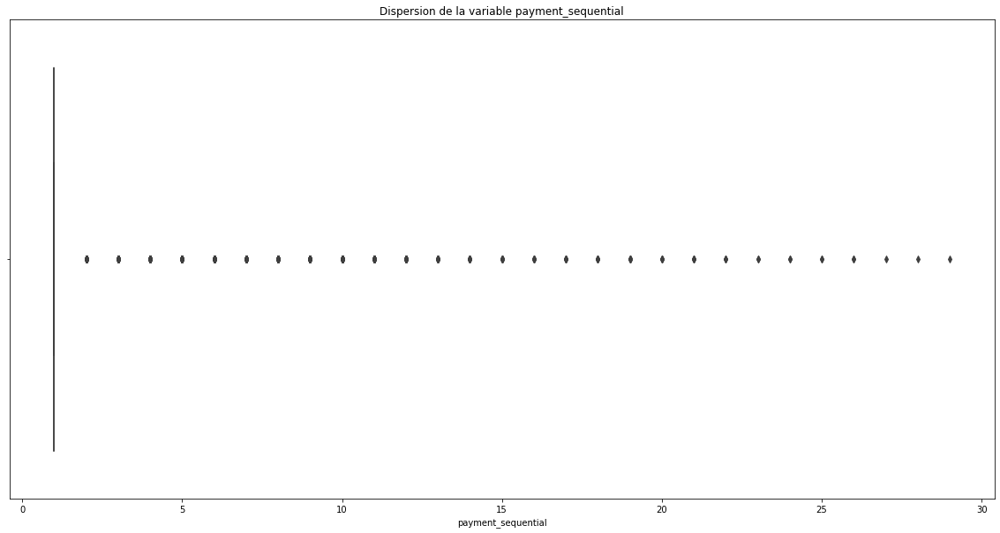

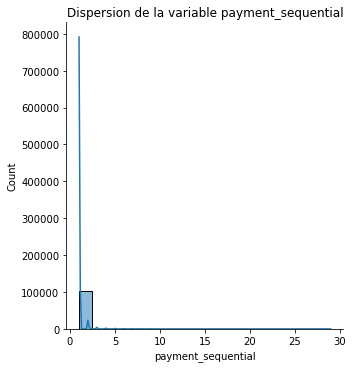

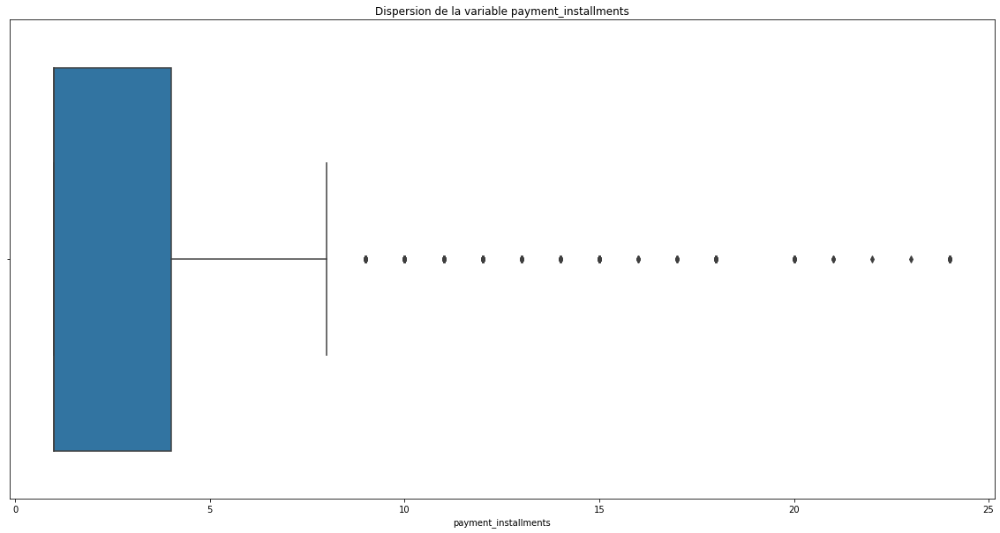

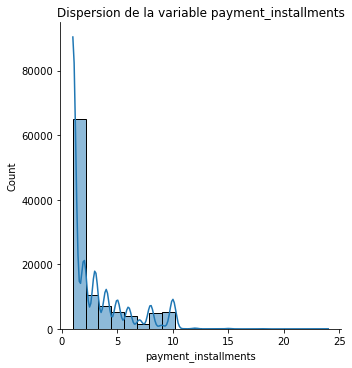

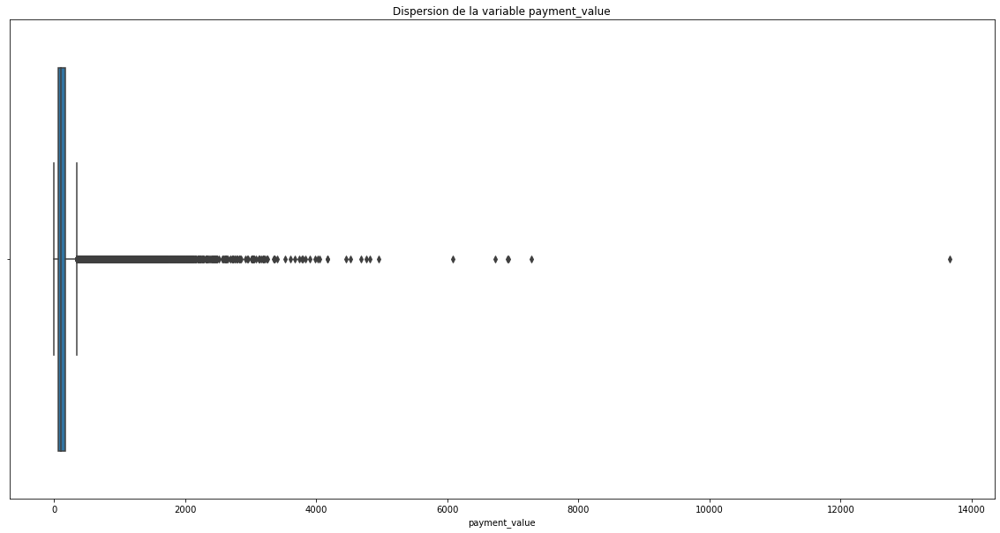

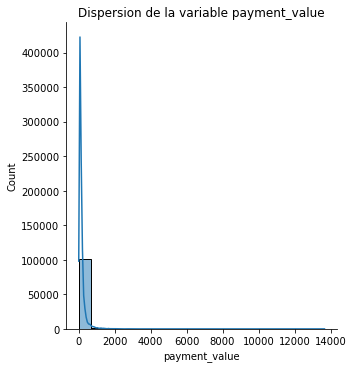

In [141]:
for col in paiement.select_dtypes(['float64','int64']).columns:
    TraceGraphique(paiement,col)
#on voit la présence de outlier 

In [27]:
i=paiement['payment_value']==0
paiement[i]
#on a 9 paiements qui sont à 0 ce sont des promotions 

,order_id,payment_sequential,payment_type,payment_installments,payment_value
19922,8bcbe01d44d147f901cd3192671144db,4,voucher,1,0.0
36822,fa65dad1b0e818e3ccc5cb0e39231352,14,voucher,1,0.0
43744,6ccb433e00daae1283ccc956189c82ae,4,voucher,1,0.0
51280,4637ca194b6387e2d538dc89b124b0ee,1,not_defined,1,0.0
57411,00b1cb0320190ca0daa2c88b35206009,1,not_defined,1,0.0
62674,45ed6e85398a87c253db47c2d9f48216,3,voucher,1,0.0
77885,fa65dad1b0e818e3ccc5cb0e39231352,13,voucher,1,0.0
94427,c8c528189310eaa44a745b8d9d26908b,1,not_defined,1,0.0
100766,b23878b3e8eb4d25a158f57d96331b18,4,voucher,1,0.0


<AxesSubplot:>

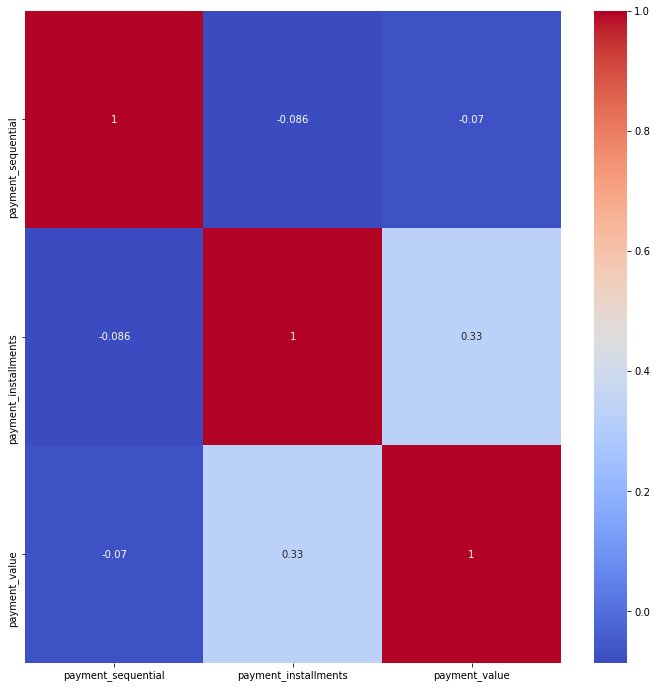

In [150]:
cor=paiement.corr()
fig,ax=plt.subplots(figsize=(12,12))
sns.heatmap(cor,annot=True,ax=ax,cmap='coolwarm')
#aucun lien entre nos features 

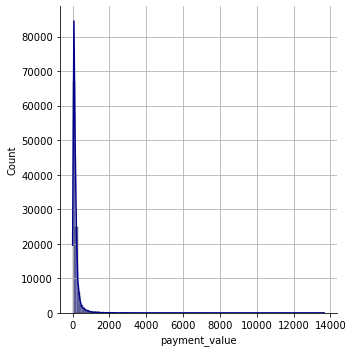

In [115]:
sns.displot(x='payment_value',data=paiement, kde=True, bins=100,color="darkblue")
plt.grid()

In [152]:
paiement.dtypes
#paiement type est un object 

order_id                 object
payment_sequential        int64
payment_type             object
payment_installments      int64
payment_value           float64
dtype: object

In [116]:
paiement.payment_type.describe(include='O')

count          103884
unique              5
top       credit_card
freq            76793
Name: payment_type, dtype: object

In [117]:
paiement.payment_type.value_counts()
#voucher c'est un bon d'échange 

credit_card    76793
boleto         19784
voucher         5775
debit_card      1529
not_defined        3
Name: payment_type, dtype: int64

Text(0.5, 1.0, 'La majorité de nos clients payent en carte bancaire et boleto')

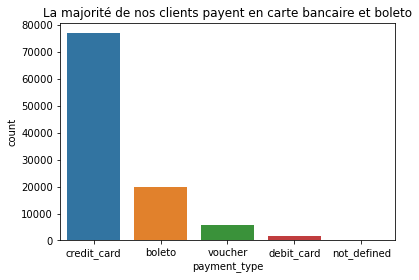

In [27]:
plt.figure()
sns.countplot(x='payment_type',data=paiement)
plt.title('La majorité de nos clients payent en carte bancaire et boleto')
#on voit que la pluspart des gens payents par cb
#suivi des tickets boleto et des bons dechange voucher

# Table ENQUETE (REVIEW)

In [79]:
review.head(5)# 100000lignes et 7 colonnes 
#avis effectués par les clients 
#order id identifiant de larticle 
#review score le score donné par les clients 

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53


In [80]:
review.duplicated().sum()
#pas de doublons 

0

In [81]:
review.isna().sum()
#avis effectué par les clients 
#code de lavis review id
#numero commande order_id
#review score score  (var discrete )
#review_comment title le titre du commentaire
#review comment message commentaire laissé par le client
#review creation date ou le commentaire a ete envoye au client 
#review_answer_timestamp donne la date ou le client a repondu 


review_id                      0
order_id                       0
review_score                   0
review_comment_title       88285
review_comment_message     58247
review_creation_date           0
review_answer_timestamp        0
dtype: int64

In [82]:
review.dtypes

review_id                  object
order_id                   object
review_score                int64
review_comment_title       object
review_comment_message     object
review_creation_date       object
review_answer_timestamp    object
dtype: object

In [28]:
#transformation de la colonne  en date
review['review_creation_date']=pd.to_datetime(review['review_creation_date'])

In [29]:
review['Month']=review['review_creation_date'].dt.month
review['Year']=review['review_creation_date'].dt.year
review['review_creation_date']=pd.to_datetime(review['review_creation_date']).dt.strftime('%d/%m/%Y')

In [30]:
#transformation de la  en date
review['review_answer_timestamp']=pd.to_datetime(review['review_answer_timestamp'])
review['review_answer_timestamp']=pd.to_datetime(review['review_answer_timestamp']).dt.strftime('%d/%m/%Y')

In [86]:
review.dtypes

review_id                  object
order_id                   object
review_score                int64
review_comment_title       object
review_comment_message     object
review_creation_date       object
review_answer_timestamp    object
Month                       int64
Year                        int64
dtype: object

## Missing

In [87]:
review.isna().sum()

review_id                      0
order_id                       0
review_score                   0
review_comment_title       88285
review_comment_message     58247
review_creation_date           0
review_answer_timestamp        0
Month                          0
Year                           0
dtype: int64

In [88]:
review['review_comment_message'].head(10)

0                                                  NaN
1                                                  NaN
2                                                  NaN
3                Recebi bem antes do prazo estipulado.
4    Parabéns lojas lannister adorei comprar pela I...
5                                                  NaN
6                                                  NaN
7                                                  NaN
8                                                  NaN
9    aparelho eficiente. no site a marca do aparelh...
Name: review_comment_message, dtype: object

In [31]:
#nous avons le titre et le contenu du commentaire qui sont manquants 
#on va remplacer par des espaces on met rien du tout 
review['review_comment_title'].fillna(' ', inplace=True)
review['review_comment_message'].fillna(' ', inplace=True)

In [32]:
review.isna().sum()

review_id                  0
order_id                   0
review_score               0
review_comment_title       0
review_comment_message     0
review_creation_date       0
review_answer_timestamp    0
Month                      0
Year                       0
dtype: int64

## Exploration

In [419]:
review.review_score.describe()
#regardons quel est est le score le plus represente
#c'est une variable quantitative discrete 

count    100000.000000
mean          4.070890
std           1.359663
min           1.000000
25%           4.000000
50%           5.000000
75%           5.000000
max           5.000000
Name: review_score, dtype: float64

In [420]:
review.review_score.value_counts()

5    57420
4    19200
1    11858
3     8287
2     3235
Name: review_score, dtype: int64

Text(0.5, 1.0, 'La pluspart de nos clients sont satisfaits avec une note de 5')

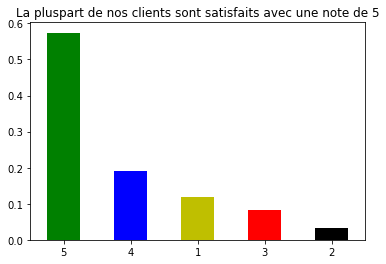

In [428]:
plt.figure()
review.review_score.value_counts(normalize=True).plot(kind='bar',color=['g','b','y',"r",'black'])
plt.xticks(rotation=0)
plt.title('La pluspart de nos clients sont satisfaits avec une note de 5')

#  Table DATASET

In [91]:
dataset=pd.read_csv('olist_orders_dataset.csv')

## Missing 

In [92]:
dataset.isna().sum()
#99441 lignes et 8 colonnes 

order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                 160
order_delivered_carrier_date     1783
order_delivered_customer_date    2965
order_estimated_delivery_date       0
dtype: int64

In [33]:
dataset['order_approved_at'].fillna(-1, inplace=True)
dataset['order_delivered_carrier_date'].fillna(0, inplace=True)
dataset['order_delivered_customer_date'].fillna(0, inplace=True)

In [34]:
dataset.isna().sum()
#on ne peut pas  supprimer les missing
#car nous avons lidentifiant de la commande et l'identifiant de larticle
#order approved la date d'approbation de la commande si c'est nan disons que
#c'est des sous qui ne rentrent pas 
#validation de la commande ainsi la date de livraison 


order_id                         0
customer_id                      0
order_status                     0
order_purchase_timestamp         0
order_approved_at                0
order_delivered_carrier_date     0
order_delivered_customer_date    0
order_estimated_delivery_date    0
dtype: int64

In [35]:
dataset.shape

(99441, 8)

In [96]:
dataset.head(5) #99441 lignes et 8 colonnes 
#identifiant de la commande 
#identifiant de larticle
#status de la commande
#order_purchase timestamp date d'achat 
#order approved at date dapprobation du paiement 
#date de la validation de la commande
#data de la livraison de la commande
#date de la livraison estimee 


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


In [97]:
dataset['customer_id'].unique().shape
#nous avons 99441 commandes 

(99441,)

In [98]:
dataset.dtypes
#on va transformer toutes les dates en format datetime

order_id                         object
customer_id                      object
order_status                     object
order_purchase_timestamp         object
order_approved_at                object
order_delivered_carrier_date     object
order_delivered_customer_date    object
order_estimated_delivery_date    object
dtype: object

In [36]:
dataset['order_purchase_timestamp']=pd.to_datetime(dataset['order_purchase_timestamp'])

In [37]:
dataset['order_purchase_timestamp'].head()

0   2017-10-02 10:56:33
1   2018-07-24 20:41:37
2   2018-08-08 08:38:49
3   2017-11-18 19:28:06
4   2018-02-13 21:18:39
Name: order_purchase_timestamp, dtype: datetime64[ns]

In [38]:
dataset['order_approved_at']=pd.to_datetime(dataset['order_approved_at'])

In [39]:
dataset['order_approved_at'].head()

0   2017-10-02 11:07:15
1   2018-07-26 03:24:27
2   2018-08-08 08:55:23
3   2017-11-18 19:45:59
4   2018-02-13 22:20:29
Name: order_approved_at, dtype: datetime64[ns]

In [40]:
dataset['order_delivered_carrier_date']=pd.to_datetime(dataset['order_delivered_carrier_date'])

In [41]:
dataset['order_delivered_carrier_date'].head()

0   2017-10-04 19:55:00
1   2018-07-26 14:31:00
2   2018-08-08 13:50:00
3   2017-11-22 13:39:59
4   2018-02-14 19:46:34
Name: order_delivered_carrier_date, dtype: datetime64[ns]

In [42]:
dataset['order_delivered_customer_date']=pd.to_datetime(dataset['order_delivered_customer_date'])
#dataset['order_delivered_customer_date']=pd.to_datetime(dataset['order_delivered_customer_date']).dt.strftime('%d/%m/%Y')

In [43]:
dataset['order_delivered_customer_date'].head(5)

0   2017-10-10 21:25:13
1   2018-08-07 15:27:45
2   2018-08-17 18:06:29
3   2017-12-02 00:28:42
4   2018-02-16 18:17:02
Name: order_delivered_customer_date, dtype: datetime64[ns]

In [44]:
dataset['order_estimated_delivery_date']=pd.to_datetime(dataset['order_estimated_delivery_date'])

In [45]:
dataset['order_estimated_delivery_date'].head()

0   2017-10-18
1   2018-08-13
2   2018-09-04
3   2017-12-15
4   2018-02-26
Name: order_estimated_delivery_date, dtype: datetime64[ns]

In [46]:
dataset['order_delivered_carrier_date']=pd.to_datetime(dataset['order_delivered_carrier_date'])

In [47]:
dataset['order_delivered_carrier_date'].head()

0   2017-10-04 19:55:00
1   2018-07-26 14:31:00
2   2018-08-08 13:50:00
3   2017-11-22 13:39:59
4   2018-02-14 19:46:34
Name: order_delivered_carrier_date, dtype: datetime64[ns]

In [48]:
dataset['order_approved_at']=pd.to_datetime(dataset['order_approved_at'])

In [49]:
dataset['order_approved_at'].head()

0   2017-10-02 11:07:15
1   2018-07-26 03:24:27
2   2018-08-08 08:55:23
3   2017-11-18 19:45:59
4   2018-02-13 22:20:29
Name: order_approved_at, dtype: datetime64[ns]

In [50]:
dataset.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26


In [114]:
dataset.dtypes

order_id                                 object
customer_id                              object
order_status                             object
order_purchase_timestamp         datetime64[ns]
order_approved_at                datetime64[ns]
order_delivered_carrier_date     datetime64[ns]
order_delivered_customer_date    datetime64[ns]
order_estimated_delivery_date    datetime64[ns]
dtype: object

In [51]:
from datetime import date 
dataset['Délai_livraison']=dataset['order_delivered_customer_date']-dataset['order_purchase_timestamp']

In [53]:
dataset['Délai_livraison'].head()

0    8 days 10:28:40
1   13 days 18:46:08
2    9 days 09:27:40
3   13 days 05:00:36
4    2 days 20:58:23
Name: Délai_livraison, dtype: timedelta64[ns]

## Exploration

In [457]:
dataset['order_status'].value_counts()
#la pluspart des données sont delivres 

delivered      96478
shipped         1107
canceled         625
unavailable      609
invoiced         314
processing       301
created            5
approved           2
Name: order_status, dtype: int64

In [28]:
df3=pd.DataFrame({'Modalite':dataset['order_status'].value_counts().index,'Frequence':dataset['order_status'].value_counts().values})

In [29]:
#df3=df3.sort_values('Modalite')
df3['F']=df3['Frequence'].cumsum()

In [30]:
df3
#97 % de nos commandes ont ete livrés

,Modalite,Frequence,F
0,delivered,96478,96478
1,shipped,1107,97585
2,canceled,625,98210
3,unavailable,609,98819
4,invoiced,314,99133
5,processing,301,99434
6,created,5,99439
7,approved,2,99441


Text(0.5, 1.0, 'La pluspart des commandes de nos clients sont délivrés')

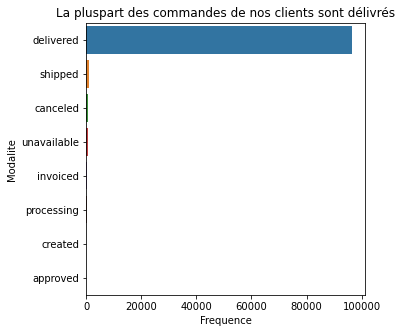

In [461]:
plt.figure(figsize=(5,5))
sns.barplot(y='Modalite',x='Frequence',data=df3.sort_values('Frequence',ascending=False))
plt.title('La pluspart des commandes de nos clients sont délivrés')

In [32]:
import plotly
import plotly.graph_objs as go
# mode offline
plotly.offline.init_notebook_mode()
plt.figure()
fig = go.Figure([go.Bar(x=df3['Modalite'], y=df3['Frequence'],text=df3['Frequence'],
            textposition='auto')])
fig.update_layout(title_text='97 % des commandes sont livrés')
fig.show()

<Figure size 432x288 with 0 Axes>

In [60]:
dataset['order_purchase_timestamp'].min()

Timestamp('2016-09-04 21:15:19')

In [61]:
dataset['order_purchase_timestamp'].max()

Timestamp('2018-10-17 17:30:18')

In [62]:
dataset['Month_achat']=dataset['order_purchase_timestamp'].dt.month_name()
dataset['Year_achat']=dataset['order_purchase_timestamp'].dt.year

In [63]:
dataset['Jour_achat']=dataset['order_purchase_timestamp'].dt.day_name()

In [64]:
dataset['Month_Livraison']=dataset['order_delivered_customer_date'].dt.month_name()

In [65]:
dataset.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,Délai_livraison,Month_achat,Year_achat,Jour_achat,Month_Livraison
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,8 days 10:28:40,October,2017,Monday,October
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,13 days 18:46:08,July,2018,Tuesday,August
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,9 days 09:27:40,August,2018,Wednesday,August
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,13 days 05:00:36,November,2017,Saturday,December
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,2 days 20:58:23,February,2018,Tuesday,February


In [33]:
date_année=pd.to_datetime(dataset['order_purchase_timestamp']).dt.strftime('%m/%Y')

In [34]:
date_année.value_counts()

11/2017    7544
01/2018    7269
03/2018    7211
04/2018    6939
05/2018    6873
02/2018    6728
08/2018    6512
07/2018    6292
06/2018    6167
12/2017    5673
10/2017    4631
08/2017    4331
09/2017    4285
07/2017    4026
05/2017    3700
06/2017    3245
03/2017    2682
04/2017    2404
02/2017    1780
01/2017     800
10/2016     324
09/2018      16
10/2018       4
09/2016       4
12/2016       1
Name: order_purchase_timestamp, dtype: int64

In [184]:
dataset['order_purchase_timestamp'].min()

Timestamp('2016-09-04 21:15:19')

In [185]:
dataset['order_purchase_timestamp'].max()

Timestamp('2018-10-17 17:30:18')

In [35]:
df9=pd.DataFrame({'Date':date_année.value_counts().index,'Nbre':date_année.value_counts().values})

In [36]:
df9.head()

,Date,Nbre
0,11/2017,7544
1,01/2018,7269
2,03/2018,7211
3,04/2018,6939
4,05/2018,6873


In [37]:
import plotly
import plotly.graph_objs as go
# mode offline
plotly.offline.init_notebook_mode()
plt.figure()
fig = go.Figure([go.Bar(x=df9['Date'], y=df9['Nbre'], text=df9['Nbre'],
                        textposition='auto')])
fig.update_layout(title_text='Novembre 2017 plus de commandes')
fig.show()

<Figure size 432x288 with 0 Axes>

In [192]:
dataset[['order_purchase_timestamp','Year_achat']].groupby(['Year_achat']).count()

,order_purchase_timestamp
Year_achat,
2016,329
2017,45101
2018,54011


Text(0.5, 1.0, 'Mois achat')

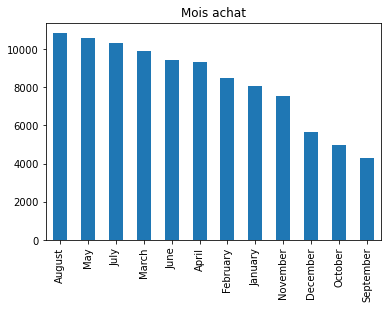

In [193]:
plt.figure()
dataset['Month_achat'].value_counts().plot(kind='bar')
plt.title('Mois achat')

Text(0.5, 1.0, 'Le mois d aout est le mois ou ya plus de livraison')

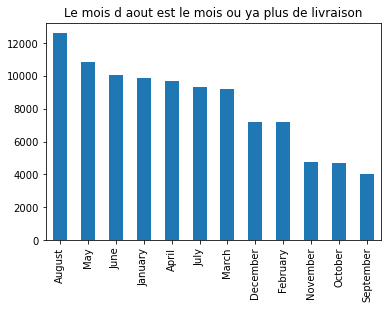

In [194]:
plt.figure()
dataset['Month_Livraison'].value_counts().plot(kind='bar')
plt.title('Le mois d aout est le mois ou ya plus de livraison')

Text(0.5, 1.0, '2018 Année ou on a beaucoup de commandes')

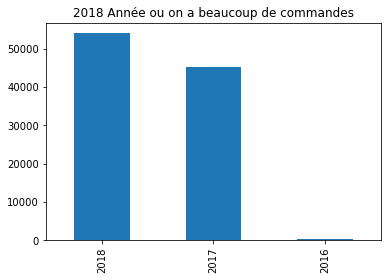

In [195]:
plt.figure()
dataset['Year_achat'].value_counts().plot(kind='bar')
plt.title('2018 Année ou on a beaucoup de commandes')

# Table Produits 

In [71]:
produit=pd.read_csv('olist_products_dataset.csv')

In [38]:
produit.head(5) #32951 lignes et 9 colonnes 
#les données des produits vendus sur olist


,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0


In [39]:
produit.duplicated(subset='product_id').sum()

0

In [131]:
produit.duplicated().sum()

0

In [132]:
produit.dtypes

product_id                     object
product_category_name          object
product_name_lenght           float64
product_description_lenght    float64
product_photos_qty            float64
product_weight_g              float64
product_length_cm             float64
product_height_cm             float64
product_width_cm              float64
dtype: object

## Missing 

In [41]:
produit.isna().sum()

product_id                      0
product_category_name         610
product_name_lenght           610
product_description_lenght    610
product_photos_qty            610
product_weight_g                2
product_length_cm               2
product_height_cm               2
product_width_cm                2
dtype: int64

In [42]:
#on va supprimer les 2 nan
produit.dropna(subset=['product_weight_g','product_length_cm'],inplace=True)
#suppression des lignes avec 2 nan

In [43]:
produit['product_category_name'].fillna('Unkwown',inplace=True)
#on va remplacer les nan de la categorie par unkwon
produit['product_name_lenght'].fillna(0,inplace=True)
#pour la taille on met 0
produit['product_description_lenght'].fillna(0,inplace=True)
#pour la description et photos on met 0
produit['product_photos_qty'].fillna(0, inplace=True)

In [44]:
produit.isna().sum()

product_id                    0
product_category_name         0
product_name_lenght           0
product_description_lenght    0
product_photos_qty            0
product_weight_g              0
product_length_cm             0
product_height_cm             0
product_width_cm              0
dtype: int64

## Exploration

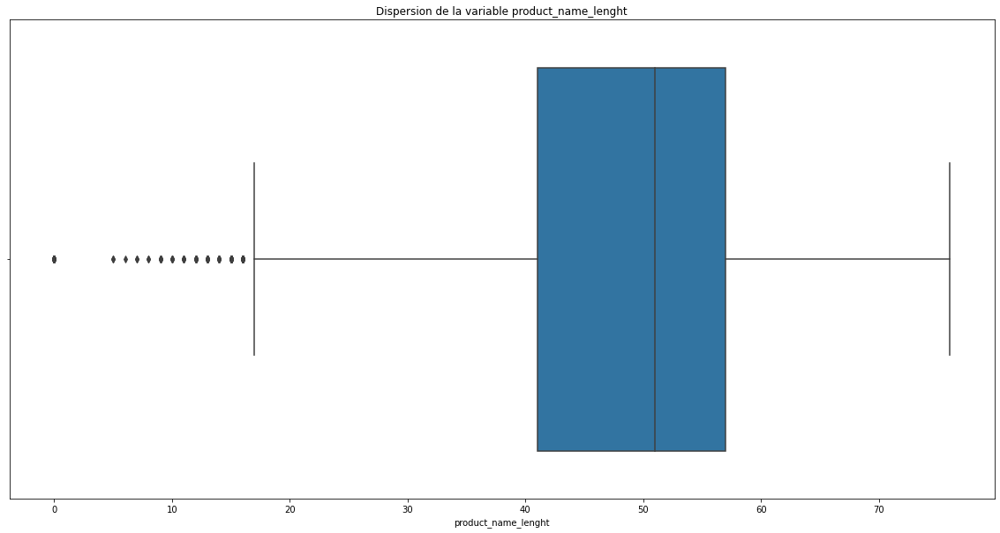

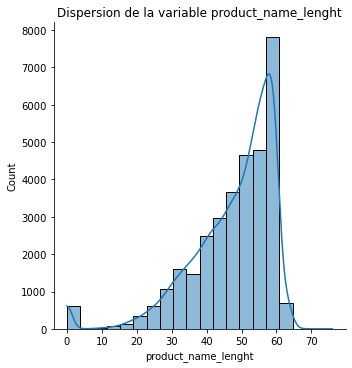

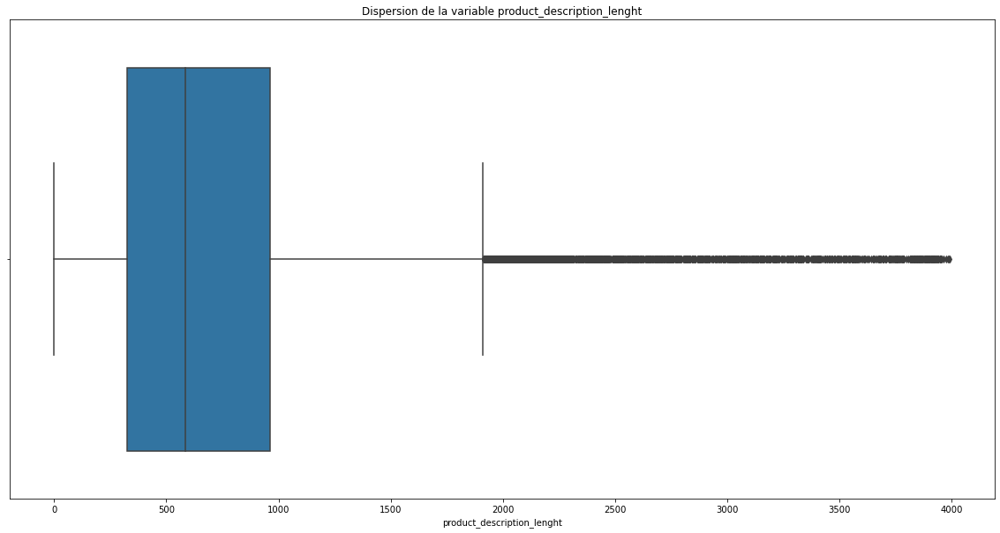

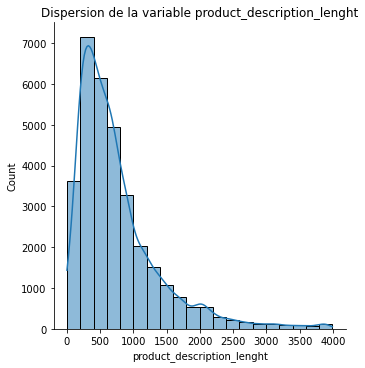

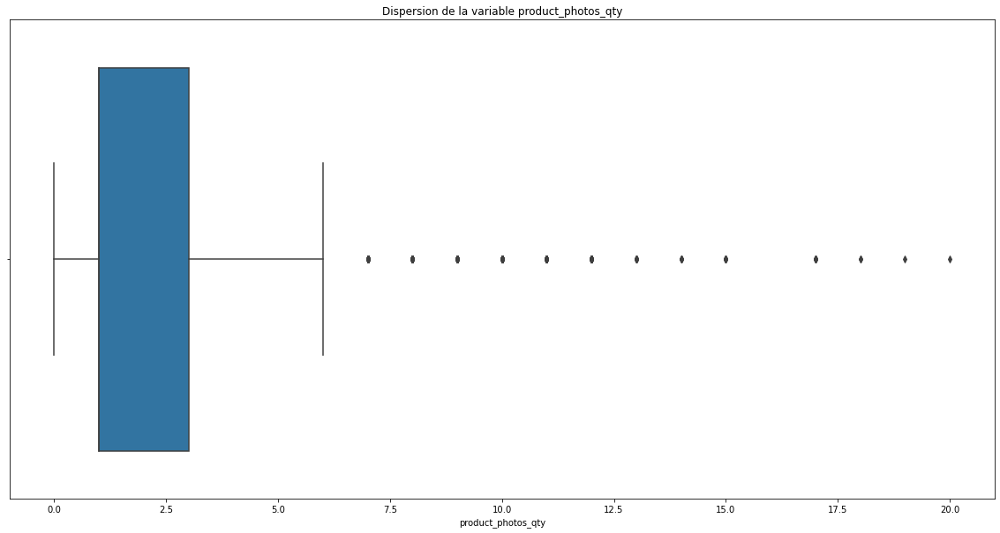

...

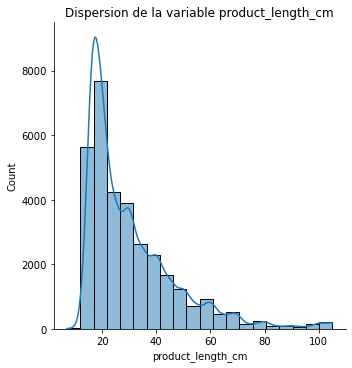

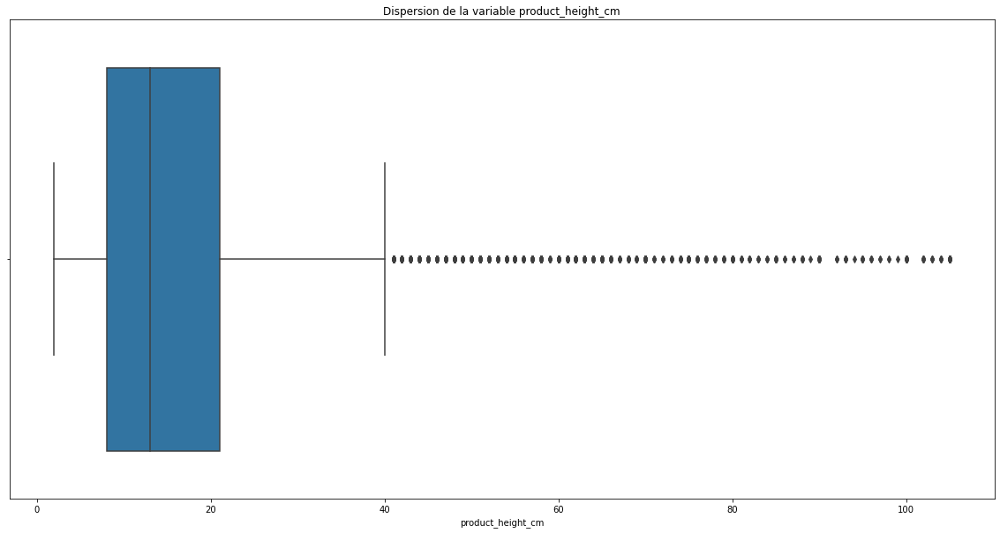

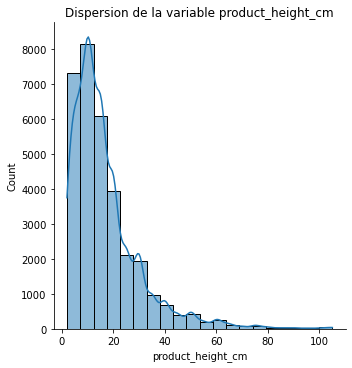

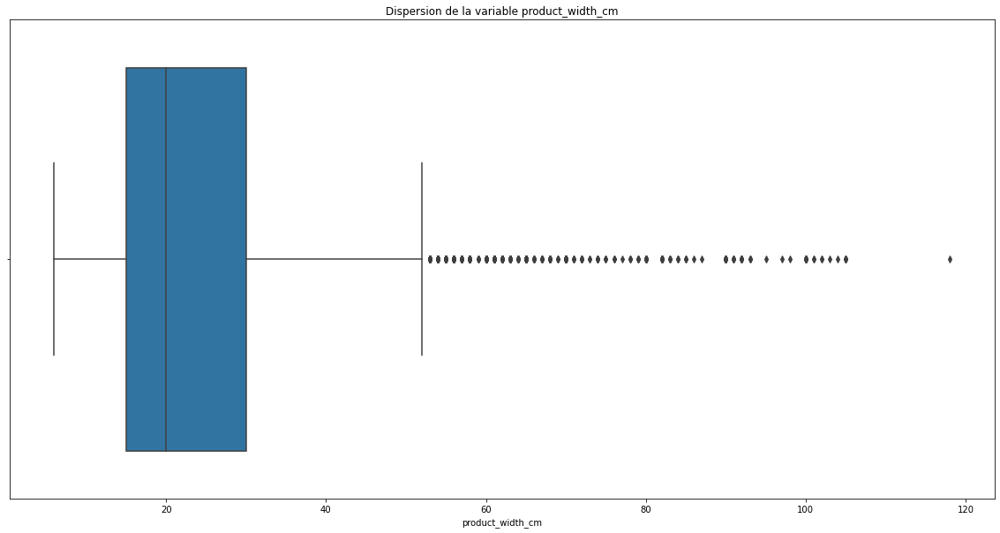

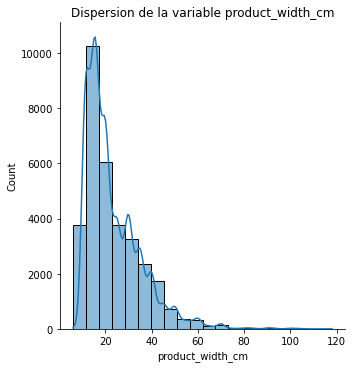

In [243]:
for col in produit.select_dtypes('float64','int64').columns:
    TraceGraphique(produit,col)

In [206]:
produit.describe()

,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
count,32949.000000,32949.000000,32949.000000,32949.000000,32949.000000,32949.000000,32949.000000
mean,47.580594,757.232814,2.148502,2276.472488,30.815078,16.937661,23.196728
std,12.069277,637.750493,1.745738,4282.038731,16.914458,13.637554,12.079047
min,0.000000,0.000000,0.000000,0.000000,7.000000,2.000000,6.000000
25%,41.000000,326.000000,1.000000,300.000000,18.000000,8.000000,15.000000
50%,51.000000,584.000000,1.000000,700.000000,25.000000,13.000000,20.000000
75%,57.000000,961.000000,3.000000,1900.000000,38.000000,21.000000,30.000000
max,76.000000,3992.000000,20.000000,40425.000000,105.000000,105.000000,118.000000


In [75]:
produit['product_category_name'].unique().shape
#nous avons 74 categories de produits 

(74,)

<AxesSubplot:>

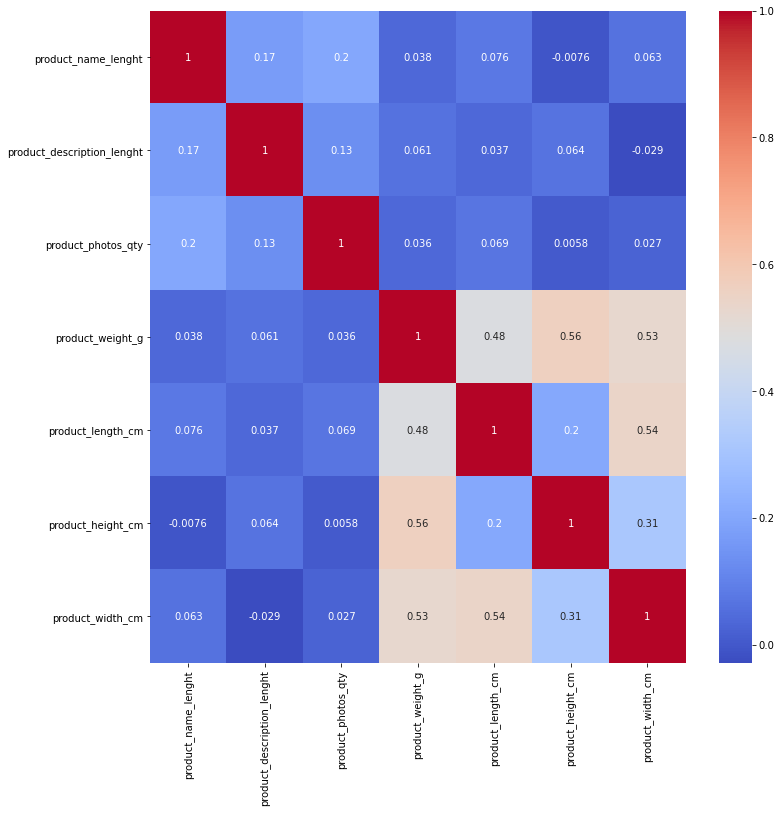

In [480]:
cor=produit.corr()
fig,ax=plt.subplots(figsize=(12,12))
sns.heatmap(cor,annot=True,ax=ax,cmap='coolwarm')
#on a aucune liaision sur nos variables 

# Table Vendeurs 

In [45]:
sellers.head(5)#3095 lignes et 4 colonnes 

,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ
3,c0f3eea2e14555b6faeea3dd58c1b1c3,4195,sao paulo,SP
4,51a04a8a6bdcb23deccc82b0b80742cf,12914,braganca paulista,SP


In [77]:
sellers.isna().sum()

seller_id                 0
seller_zip_code_prefix    0
seller_city               0
seller_state              0
dtype: int64

In [483]:
sellers.duplicated().sum()

0

In [48]:
sellers['seller_state'].unique()
#nous avons les infos sur les vendeurs, ils se trouvent sur 23 etats 

array(['SP', 'RJ', 'PE', 'PR', 'GO', 'SC', 'BA', 'DF', 'RS', 'MG', 'RN',
       'MT', 'CE', 'PB', 'AC', 'ES', 'RO', 'PI', 'MS', 'SE', 'MA', 'AM',
       'PA'], dtype=object)

In [214]:
sellers['seller_id'].unique().shape
#nous avons 3095 vendeurs 

(3095,)

#  Table Traduction Categories

In [52]:
category.head()#71 lignes et 2 colonnes 
#traduction des categories en anglais
#on va le concatener avec notre data frame produits 

,product_category_name,product_category_name_english
0,beleza_saude,health_beauty
1,informatica_acessorios,computers_accessories
2,automotivo,auto
3,cama_mesa_banho,bed_bath_table
4,moveis_decoracao,furniture_decor


In [53]:
category.shape #nous avons 71 categories de produits 

(71, 2)

In [54]:
produit.columns

Index(['product_id', 'product_category_name', 'product_name_lenght',
       'product_description_lenght', 'product_photos_qty', 'product_weight_g',
       'product_length_cm', 'product_height_cm', 'product_width_cm'],
      dtype='object')

In [55]:
category.columns

Index(['product_category_name', 'product_category_name_english'], dtype='object')

# Concatenation des produits 

In [56]:
#nous avons une colonne en commun utilisation de pd.merge 
#on supprime la colonne produit category name en espagnol 
produit=pd.merge(produit,category).drop(columns=['product_category_name'])

In [57]:
produit.isna().sum()

product_id                       0
product_name_lenght              0
product_description_lenght       0
product_photos_qty               0
product_weight_g                 0
product_length_cm                0
product_height_cm                0
product_width_cm                 0
product_category_name_english    0
dtype: int64

In [58]:
produit.dtypes

product_id                        object
product_name_lenght              float64
product_description_lenght       float64
product_photos_qty               float64
product_weight_g                 float64
product_length_cm                float64
product_height_cm                float64
product_width_cm                 float64
product_category_name_english     object
dtype: object

In [59]:
produit['product_category_name_english'].unique().shape
#nous allons regrouper les modalites en 12 modalites 

(71,)

In [60]:
CATEGS = {
#home
'HOME':['furniture_living_room',
'furniture_mattress_and_upholstery',
'furniture_bedroom',
'furniture_decor',
'bed_bath_table',
'kitchen_dining_laundry_garden_furniture',
'la_cuisine',
'home_confort',
'home_comfort_2',
'christmas_supplies'],
    
#appliances electro menager
'APPLIANCES':[
'small_appliances',
'small_appliances_home_oven_and_coffee',
'home_appliances_2',
'home_appliances',
'housewares'] ,
    
#construction
'CONSTRUCTION':[
'construction_tools_construction',
'costruction_tools_garden',
'costruction_tools_tools',
'construction_tools_safety',
'construction_tools_lights',
'home_construction',
'air_conditioning'] ,
#furnitures
    
#office
'OFFICE': [
'office_furniture',
'industry_commerce_and_business',
'stationery',
'agro_industry_and_commerce',
'signaling_and_security',
'furnitures',
'security_and_services'] ,
#electronics
'ELECTRONICS': [
'telephony',
'electronics',
'computers_accessories',
'consoles_games',
'fixed_telephony',
'audio',
'computers',
'tablets_printing_image'] ,
#sports_leisure
'SPORT' :[
'sports_leisure',
'musical_instruments',
'party_supplies',
'luggage_accessories'],
#arts
'ART' : [
'books',
'books_imported',
'books_general_interest',
'books_technical',
'art',
'toys',
'cine_photo',
'cds_dvds_musicals',
'music',
'dvds_blu_ray',
'arts_and_craftmanship'] ,
#fashion
'FASHION': [ 
'watches_gifts',
'fashion_bags_accessories',
'fashion_underwear_beach',
'fashion_shoes', 
'fashion_male_clothing',
'fashio_female_clothing',
'fashion_sport',
'fashion_childrens_clothes'],
#health_beauty
'BEAUTE' : [
'health_beauty', 
'baby',
'diapers_and_hygiene',
'perfumery' ] ,
#garden and pets
'JARDIN_PET': [
'flowers',
'pet_shop',
'garden_tools'] ,
#auto
'AUTO' : [
'auto'] ,
#food_drinks
'FOOD_DRINK' : [
'food_drink',
'food',
'drinks' ] ,
#other
'AUTRE': [
'Unknown',
'market_place', 
'cool_stuff' ] }

In [61]:
def compare_word(word):
    # Vérifier si 'word' est dans notre regroupement de modalites.
    # Chaque catégorie est une clé de notre dico CATEG
    # cette fonction permet de chercher dans la colonne si ya une valeur si il est
    # item on retourne la cle
    if word == ' ' or word == 'nan':
        pass
    for key, val in CATEGS.items():
        if word in val:
            return key
    pass

In [62]:
def new_categ(data, lab):
    # On va creer une nouvelle colonne qui contient nos 18 modalites regrouper

    list_column = []  # creation d'une liste
    for lab in data[lab]:
        s = compare_word(lab)
        list_column.append(s)

    return list_column

In [63]:
produit['product_category_name_english']=new_categ(produit, lab='product_category_name_english')

In [64]:
produit['product_category_name_english'].value_counts()
#la categorie de produit le plus vendu est la categorie maison 
#suivi de la beaute et de l'electronique
#la moins vendue est lalimentaire et les boissons

HOME            6182
BEAUTE          4242
ELECTRONICS     3820
SPORT           3531
APPLIANCES      3057
FASHION         2550
ART             1959
AUTO            1900
JARDIN_PET      1486
OFFICE          1395
CONSTRUCTION    1045
AUTRE            893
FOOD_DRINK       267
Name: product_category_name_english, dtype: int64

In [65]:
df4=pd.DataFrame({'Modalites': produit['product_category_name_english'].value_counts().index, 'Frequence' : produit['product_category_name_english'].value_counts().values })

Text(0.5, 1.0, 'Les produits de beauté et maison sont les plus vendus')

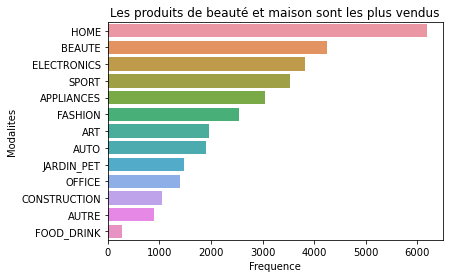

In [66]:
plt.figure()
sns.barplot(y='Modalites',x='Frequence',data=df4.sort_values('Frequence',ascending=False))
plt.title('Les produits de beauté et maison sont les plus vendus')

# REGROUPEMENT DATA FRAME

In [67]:
custumer.columns #information sur le client

Index(['customer_id', 'customer_unique_id', 'customer_zip_code_prefix',
       'customer_city', 'customer_state'],
      dtype='object')

In [68]:
items.columns #données sur les articles pour chaque commande 

Index(['order_id', 'order_item_id', 'product_id', 'seller_id',
       'shipping_limit_date', 'price', 'freight_value'],
      dtype='object')

In [502]:
dataset.columns #données sur les commandes 

Index(['order_id', 'customer_id', 'order_status', 'order_purchase_timestamp',
       'order_approved_at', 'order_delivered_carrier_date',
       'order_delivered_customer_date', 'order_estimated_delivery_date',
       'Délai_livraison', 'Month_achat', 'Year_achat', 'Jour_achat',
       'Month_Livraison'],
      dtype='object')

In [503]:
produit.columns #la liste des produits vendus 

Index(['product_id', 'product_name_lenght', 'product_description_lenght',
       'product_photos_qty', 'product_weight_g', 'product_length_cm',
       'product_height_cm', 'product_width_cm',
       'product_category_name_english'],
      dtype='object')

In [504]:
items.shape,produit.shape,dataset.shape

((112650, 7), (32327, 9), (99441, 13))

In [69]:
d0=pd.merge(items,produit,how='left')
#permet de connaitre l'article et le produit qui lui est associé

In [72]:
d0.shape

(112650, 15)

In [73]:
d0.isna().sum()

order_id                            0
order_item_id                       0
product_id                          0
seller_id                           0
shipping_limit_date                 0
price                               0
freight_value                       0
product_name_lenght              1628
product_description_lenght       1628
product_photos_qty               1628
product_weight_g                 1628
product_length_cm                1628
product_height_cm                1628
product_width_cm                 1628
product_category_name_english    1628
dtype: int64

In [74]:
#suppression des nan
d0.dropna(subset=['product_weight_g','product_length_cm','product_category_name_english',\
               'product_height_cm','product_name_lenght','product_width_cm','product_description_lenght',\
                 'product_photos_qty'],inplace=True)

In [75]:
d0.shape #on a perdu 1628 lignes 

(111022, 15)

In [76]:
d0.isna().sum()

order_id                         0
order_item_id                    0
product_id                       0
seller_id                        0
shipping_limit_date              0
price                            0
freight_value                    0
product_name_lenght              0
product_description_lenght       0
product_photos_qty               0
product_weight_g                 0
product_length_cm                0
product_height_cm                0
product_width_cm                 0
product_category_name_english    0
dtype: int64

In [77]:
d0.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29,58.0,598.0,4.0,650.0,28.0,9.0,14.0,AUTRE
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93,56.0,239.0,2.0,30000.0,50.0,30.0,40.0,JARDIN_PET
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87,59.0,695.0,2.0,3050.0,33.0,13.0,33.0,HOME
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79,42.0,480.0,1.0,200.0,16.0,10.0,15.0,BEAUTE
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14,59.0,409.0,1.0,3750.0,35.0,40.0,30.0,JARDIN_PET


In [78]:
d0.describe()

,order_item_id,price,freight_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
count,111022.000000,111022.000000,111022.000000,111022.000000,111022.000000,111022.000000,111022.000000,111022.000000,111022.000000,111022.000000
mean,1.198231,120.738772,20.025485,48.774432,787.870854,2.209562,2099.897507,30.212210,16.624966,23.042172
std,0.706934,183.292804,15.841529,10.025942,652.172826,1.721434,3754.972723,16.190473,13.468184,11.717712
min,1.000000,0.850000,0.000000,5.000000,4.000000,1.000000,0.000000,7.000000,2.000000,6.000000
25%,1.000000,39.900000,13.080000,42.000000,348.000000,1.000000,300.000000,18.000000,8.000000,15.000000
50%,1.000000,74.990000,16.310000,52.000000,602.500000,1.000000,700.000000,25.000000,13.000000,20.000000
75%,1.000000,134.900000,21.180000,57.000000,987.000000,3.000000,1800.000000,38.000000,20.000000,30.000000
max,21.000000,6735.000000,409.680000,76.000000,3992.000000,20.000000,40425.000000,105.000000,105.000000,118.000000


In [513]:
i=d0['price']==6735.000000
d0[i]
#on veut regarder quel est le produit le plus cher c'est appareil 
#electromenager

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
3556,0812eb902a67711a1cb742b3cdaa65ae,1,489ae2aa008f021502940f251d4cce7f,e3b4998c7a498169dc7bce44e6bb6277,2017-02-16 20:37:36,6735.0,194.31,31.0,875.0,2.0,30000.0,60.0,61.0,33.0,APPLIANCES


In [514]:
i=d0['price']==0.850000
d0[i]
#le produit le moins cher ce sont des matériaux de constructions

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
27652,3ee6513ae7ea23bdfab5b9ab60bffcb5,1,8a3254bee785a526d548a81a9bc3c9be,96804ea39d96eb908e7c3afdb671bb9e,2018-05-04 03:55:26,0.85,18.23,25.0,1041.0,5.0,200.0,16.0,4.0,11.0,CONSTRUCTION
48625,6e864b3f0ec71031117ad4cf46b7f2a1,1,8a3254bee785a526d548a81a9bc3c9be,96804ea39d96eb908e7c3afdb671bb9e,2018-05-02 20:30:34,0.85,18.23,25.0,1041.0,5.0,200.0,16.0,4.0,11.0,CONSTRUCTION
87081,c5bdd8ef3c0ec420232e668302179113,2,8a3254bee785a526d548a81a9bc3c9be,96804ea39d96eb908e7c3afdb671bb9e,2018-05-07 02:55:22,0.85,22.30,25.0,1041.0,5.0,200.0,16.0,4.0,11.0,CONSTRUCTION


In [79]:
d1=pd.merge(dataset,d0,how='left')
#on veut savoir quelle commande est associé par quel article et quel produit 
#on veut garder tous les éléments de dataset

In [80]:
d1.isna().sum()

order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                 161
order_delivered_carrier_date     1962
order_delivered_customer_date    3220
order_estimated_delivery_date       0
order_item_id                    2186
product_id                       2186
seller_id                        2186
shipping_limit_date              2186
price                            2186
freight_value                    2186
product_name_lenght              2186
product_description_lenght       2186
product_photos_qty               2186
product_weight_g                 2186
product_length_cm                2186
product_height_cm                2186
product_width_cm                 2186
product_category_name_english    2186
dtype: int64

In [81]:
d1.shape

(113208, 22)

In [82]:
#suppression des nan
d1.dropna(subset=['product_weight_g','product_length_cm','product_category_name_english',\
               'product_height_cm','product_name_lenght','product_width_cm','product_description_lenght',\
                 'product_photos_qty','freight_value','price','shipping_limit_date',\
                 'seller_id','product_id','order_item_id'],inplace=True)

In [83]:
d1.shape

(111022, 22)

In [84]:
Missing(d1)

order_id                         0.000000
customer_id                      0.000000
order_status                     0.000000
order_purchase_timestamp         0.000000
order_approved_at                0.012610
order_delivered_carrier_date     1.040334
order_delivered_customer_date    2.149124
order_estimated_delivery_date    0.000000
order_item_id                    0.000000
product_id                       0.000000
seller_id                        0.000000
shipping_limit_date              0.000000
price                            0.000000
freight_value                    0.000000
product_name_lenght              0.000000
product_description_lenght       0.000000
product_photos_qty               0.000000
product_weight_g                 0.000000
product_length_cm                0.000000
product_height_cm                0.000000
product_width_cm                 0.000000
product_category_name_english    0.000000
dtype: float64

In [167]:
d1.shape

(111022, 27)

In [168]:
d1.head(3)

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,Délai_livraison,Month_achat,...,price,freight_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,8 days 10:28:40,October,...,29.99,8.72,40.0,268.0,4.0,500.0,19.0,8.0,13.0,APPLIANCES
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,13 days 18:46:08,July,...,118.70,22.76,29.0,178.0,1.0,400.0,19.0,13.0,19.0,BEAUTE
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,9 days 09:27:40,August,...,159.90,19.22,46.0,232.0,1.0,420.0,24.0,19.0,21.0,AUTO


In [522]:
#pour avoir des infos sur la commande 
i=d1['customer_id']=='9ef432eb6251297304e76186b10a928d'
d1[i]

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,Délai_livraison,Month_achat,...,price,freight_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,8 days 10:28:40,October,...,29.99,8.72,40.0,268.0,4.0,500.0,19.0,8.0,13.0,APPLIANCES


In [85]:
d2=pd.merge(custumer,d1,how='left')
#on garde tous les elements de customer

In [86]:
d2.shape

(113208, 26)

In [106]:
d2.isna().sum()

customer_id                         0
customer_unique_id                  0
customer_zip_code_prefix            0
customer_city                       0
customer_state                      0
order_id                         2186
order_status                     2186
order_purchase_timestamp         2186
order_approved_at                2186
order_delivered_carrier_date     2186
order_delivered_customer_date    2186
order_estimated_delivery_date    2186
Délai_livraison                  2186
Month_achat                      2186
Year_achat                       2186
Jour_achat                       2186
Month_Livraison                  2186
order_item_id                    2186
product_id                       2186
seller_id                        2186
shipping_limit_date              2186
price                            2186
freight_value                    2186
product_name_lenght              2186
product_description_lenght       2186
product_photos_qty               2186
product_weig

In [87]:
d2.shape

(113208, 26)

In [88]:
d2.dropna(inplace=True)#suppression des nan 

In [89]:
d2.isna().sum()

customer_id                      0
customer_unique_id               0
customer_zip_code_prefix         0
customer_city                    0
customer_state                   0
order_id                         0
order_status                     0
order_purchase_timestamp         0
order_approved_at                0
order_delivered_carrier_date     0
order_delivered_customer_date    0
order_estimated_delivery_date    0
order_item_id                    0
product_id                       0
seller_id                        0
shipping_limit_date              0
price                            0
freight_value                    0
product_name_lenght              0
product_description_lenght       0
product_photos_qty               0
product_weight_g                 0
product_length_cm                0
product_height_cm                0
product_width_cm                 0
product_category_name_english    0
dtype: int64

In [90]:
d2.shape

(108621, 26)

In [91]:
d2.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,price,freight_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,...,124.99,21.88,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,OFFICE
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP,29150127e6685892b6eab3eec79f59c7,delivered,2018-01-12 20:48:24,2018-01-12 20:58:32,2018-01-15 17:14:59,...,289.00,46.48,43.0,1002.0,3.0,10150.0,89.0,15.0,40.0,APPLIANCES
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP,b2059ed67ce144a36e2aa97d2c9e9ad2,delivered,2018-05-19 16:07:45,2018-05-20 16:19:10,2018-06-11 14:31:00,...,139.94,17.79,55.0,955.0,1.0,8267.0,52.0,52.0,17.0,OFFICE
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP,951670f92359f4fe4a63112aa7306eba,delivered,2018-03-13 16:06:38,2018-03-13 17:29:19,2018-03-27 23:22:42,...,149.94,23.36,48.0,1066.0,1.0,12160.0,56.0,51.0,28.0,OFFICE
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP,6b7d50bd145f6fc7f33cebabd7e49d0f,delivered,2018-07-29 09:51:30,2018-07-29 10:10:09,2018-07-30 15:16:00,...,230.00,22.25,61.0,407.0,1.0,5200.0,45.0,15.0,35.0,HOME


In [530]:
i=d2['customer_unique_id']=='861eff4711a542e4b93843c6dd7febb0'
d2[i]
#le client avec l'identifiant ci joint a commande quoi ?

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,price,freight_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,...,124.99,21.88,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,OFFICE


In [177]:
paiement.shape

(103884, 5)

In [178]:
paiement.columns

Index(['order_id', 'payment_sequential', 'payment_type',
       'payment_installments', 'payment_value'],
      dtype='object')

In [92]:
d3=pd.merge(d2,paiement,how='left')

In [93]:
d3.shape

(113370, 30)

In [181]:
d3.isna().sum()

customer_id                      0
customer_unique_id               0
customer_zip_code_prefix         0
customer_city                    0
customer_state                   0
order_id                         0
order_status                     0
order_purchase_timestamp         0
order_approved_at                0
order_delivered_carrier_date     0
order_delivered_customer_date    0
order_estimated_delivery_date    0
Délai_livraison                  0
Month_achat                      0
Year_achat                       0
Jour_achat                       0
Month_Livraison                  0
order_item_id                    0
product_id                       0
seller_id                        0
shipping_limit_date              0
price                            0
freight_value                    0
product_name_lenght              0
product_description_lenght       0
product_photos_qty               0
product_weight_g                 0
product_length_cm                0
product_height_cm   

In [111]:
d3.dropna(inplace=True)

In [112]:
d3.shape

(115874, 35)

In [184]:
d3.head(5)

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,payment_sequential,payment_type,payment_installments,payment_value
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,...,1.0,8683.0,54.0,64.0,31.0,OFFICE,1.0,credit_card,2.0,146.87
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP,29150127e6685892b6eab3eec79f59c7,delivered,2018-01-12 20:48:24,2018-01-12 20:58:32,2018-01-15 17:14:59,...,3.0,10150.0,89.0,15.0,40.0,APPLIANCES,1.0,credit_card,8.0,335.48
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP,b2059ed67ce144a36e2aa97d2c9e9ad2,delivered,2018-05-19 16:07:45,2018-05-20 16:19:10,2018-06-11 14:31:00,...,1.0,8267.0,52.0,52.0,17.0,OFFICE,1.0,credit_card,7.0,157.73
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP,951670f92359f4fe4a63112aa7306eba,delivered,2018-03-13 16:06:38,2018-03-13 17:29:19,2018-03-27 23:22:42,...,1.0,12160.0,56.0,51.0,28.0,OFFICE,1.0,credit_card,1.0,173.30
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP,6b7d50bd145f6fc7f33cebabd7e49d0f,delivered,2018-07-29 09:51:30,2018-07-29 10:10:09,2018-07-30 15:16:00,...,1.0,5200.0,45.0,15.0,35.0,HOME,1.0,credit_card,8.0,252.25


In [185]:
#maintenant on connait le numero du client sa commande comment il a paye 
j=d3['customer_unique_id']=='290c77bc529b7ac935b93aa66c333dc3'
d3[j]

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,payment_sequential,payment_type,payment_installments,payment_value
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP,29150127e6685892b6eab3eec79f59c7,delivered,2018-01-12 20:48:24,2018-01-12 20:58:32,2018-01-15 17:14:59,...,3.0,10150.0,89.0,15.0,40.0,APPLIANCES,1.0,credit_card,8.0,335.48


In [186]:
review.shape,d3.shape

((100000, 9), (115874, 35))

In [187]:
review.columns

Index(['review_id', 'order_id', 'review_score', 'review_comment_title',
       'review_comment_message', 'review_creation_date',
       'review_answer_timestamp', 'Month', 'Year'],
      dtype='object')

In [94]:
dataEtude=pd.merge(d3,review,how='left')

In [114]:
dataEtude.shape

(116577, 43)

In [190]:
dataEtude.columns

Index(['customer_id', 'customer_unique_id', 'customer_zip_code_prefix',
       'customer_city', 'customer_state', 'order_id', 'order_status',
       'order_purchase_timestamp', 'order_approved_at',
       'order_delivered_carrier_date', 'order_delivered_customer_date',
       'order_estimated_delivery_date', 'Délai_livraison', 'Month_achat',
       'Year_achat', 'Jour_achat', 'Month_Livraison', 'order_item_id',
       'product_id', 'seller_id', 'shipping_limit_date', 'price',
       'freight_value', 'product_name_lenght', 'product_description_lenght',
       'product_photos_qty', 'product_weight_g', 'product_length_cm',
       'product_height_cm', 'product_width_cm',
       'product_category_name_english', 'payment_sequential', 'payment_type',
       'payment_installments', 'payment_value', 'review_id', 'review_score',
       'review_comment_title', 'review_comment_message',
       'review_creation_date', 'review_answer_timestamp', 'Month', 'Year'],
      dtype='object')

In [191]:
dataEtude.isna().sum()

customer_id                      0
customer_unique_id               0
customer_zip_code_prefix         0
customer_city                    0
customer_state                   0
order_id                         0
order_status                     0
order_purchase_timestamp         0
order_approved_at                0
order_delivered_carrier_date     0
order_delivered_customer_date    0
order_estimated_delivery_date    0
Délai_livraison                  0
Month_achat                      0
Year_achat                       0
Jour_achat                       0
Month_Livraison                  0
order_item_id                    0
product_id                       0
seller_id                        0
shipping_limit_date              0
price                            0
freight_value                    0
product_name_lenght              0
product_description_lenght       0
product_photos_qty               0
product_weight_g                 0
product_length_cm                0
product_height_cm   

In [95]:
dataEtude.shape #nous avons 116577 lignes / commandes avec 43 informations sur les commandes

(114053, 36)

In [116]:
dataEtude['customer_unique_id'].unique().shape
#nous avons 116577 lignes / commandes avec 43 informations sur les commandes
#nous avons 94084 clients 

(94084,)

# Sélection Features

In [117]:
dataEtude.columns

Index(['customer_id', 'customer_unique_id', 'customer_zip_code_prefix',
       'customer_city', 'customer_state', 'order_id', 'order_status',
       'order_purchase_timestamp', 'order_approved_at',
       'order_delivered_carrier_date', 'order_delivered_customer_date',
       'order_estimated_delivery_date', 'Délai_livraison', 'Month_achat',
       'Year_achat', 'Jour_achat', 'Month_Livraison', 'order_item_id',
       'product_id', 'seller_id', 'shipping_limit_date', 'price',
       'freight_value', 'product_name_lenght', 'product_description_lenght',
       'product_photos_qty', 'product_weight_g', 'product_length_cm',
       'product_height_cm', 'product_width_cm',
       'product_category_name_english', 'payment_sequential', 'payment_type',
       'payment_installments', 'payment_value', 'review_id', 'review_score',
       'review_comment_title', 'review_comment_message',
       'review_creation_date', 'review_answer_timestamp', 'Month', 'Year'],
      dtype='object')

In [118]:
dataEtude.isna().sum()

customer_id                      0
customer_unique_id               0
customer_zip_code_prefix         0
customer_city                    0
customer_state                   0
order_id                         0
order_status                     0
order_purchase_timestamp         0
order_approved_at                0
order_delivered_carrier_date     0
order_delivered_customer_date    0
order_estimated_delivery_date    0
Délai_livraison                  0
Month_achat                      0
Year_achat                       0
Jour_achat                       0
Month_Livraison                  0
order_item_id                    0
product_id                       0
seller_id                        0
shipping_limit_date              0
price                            0
freight_value                    0
product_name_lenght              0
product_description_lenght       0
product_photos_qty               0
product_weight_g                 0
product_length_cm                0
product_height_cm   

les colonnes vides sont:




[]

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,Month,Year
number of missing values,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
number of values,116577,116577,116577,116577,116577,116577,116577,116577,116577,116577,...,116577,116577,116577,116577,116577,116577,116577,116577,116577,116577
fill_rate,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


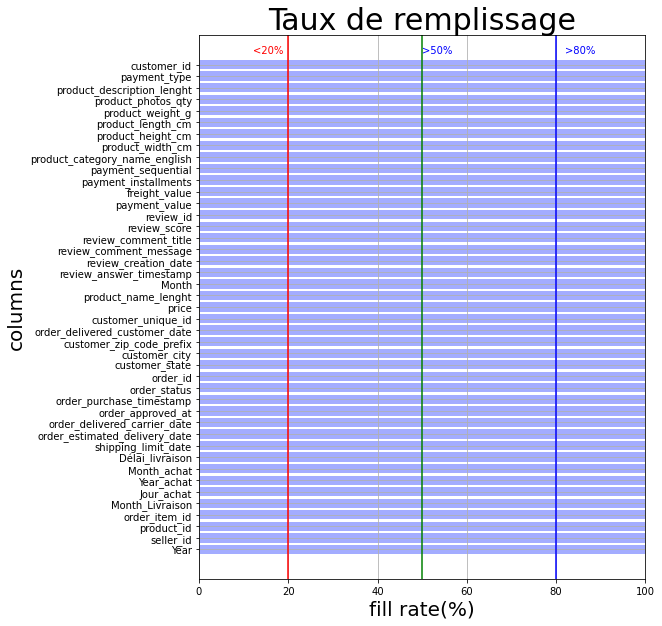

In [619]:
TraceValeurMissing(dataEtude)

In [552]:
dataEtude.shape

(116577, 43)

In [553]:
dataEtude.dtypes.value_counts()

object             18
float64            14
datetime64[ns]      6
int64               4
timedelta64[ns]     1
dtype: int64

In [554]:
dataEtude.select_dtypes(['int64','float64']).columns

Index(['customer_zip_code_prefix', 'Year_achat', 'order_item_id', 'price',
       'freight_value', 'product_name_lenght', 'product_description_lenght',
       'product_photos_qty', 'product_weight_g', 'product_length_cm',
       'product_height_cm', 'product_width_cm', 'payment_sequential',
       'payment_installments', 'payment_value', 'review_score', 'Month',
       'Year'],
      dtype='object')

In [555]:
dataEtude.select_dtypes(['object']).columns

Index(['customer_id', 'customer_unique_id', 'customer_city', 'customer_state',
       'order_id', 'order_status', 'Month_achat', 'Jour_achat',
       'Month_Livraison', 'product_id', 'seller_id',
       'product_category_name_english', 'payment_type', 'review_id',
       'review_comment_title', 'review_comment_message',
       'review_creation_date', 'review_answer_timestamp'],
      dtype='object')

In [556]:
dataEtude.select_dtypes(['datetime64[ns]','timedelta64[ns]']).columns

Index(['order_purchase_timestamp', 'order_approved_at',
       'order_delivered_carrier_date', 'order_delivered_customer_date',
       'order_estimated_delivery_date', 'Délai_livraison',
       'shipping_limit_date'],
      dtype='object')

In [119]:
features=['order_item_id', 'price',
       'freight_value','payment_sequential',
       'payment_installments', 'payment_value', 'review_score','customer_id',\
          'customer_unique_id','customer_city', 'customer_state',\
       'order_id', 'order_status', 'order_purchase_timestamp','product_id',\
        'order_delivered_customer_date', 'Délai_livraison',
       'product_category_name_english', 'payment_type']

In [120]:
len(features)

19

In [121]:
index=dataEtude.columns.isin(features)

In [122]:
#on a selectionné nos variables
dataFinal=dataEtude[dataEtude.columns[index]]

In [123]:
dataFinal.columns

Index(['customer_id', 'customer_unique_id', 'customer_city', 'customer_state',
       'order_id', 'order_status', 'order_purchase_timestamp',
       'order_delivered_customer_date', 'Délai_livraison', 'order_item_id',
       'product_id', 'price', 'freight_value', 'product_category_name_english',
       'payment_sequential', 'payment_type', 'payment_installments',
       'payment_value', 'review_score'],
      dtype='object')

In [288]:
#from sklearn.impute import KNNImputer
#imputer=KNNImputer(n_neighbors=2)
#dataEtude['review_score']=imputer.fit_transform(dataEtude['review_score'].values.reshape(dataEtude.shape[0],1))

# Analyse exploratoire 1

## Etats

In [124]:
dataFinal.dtypes

customer_id                               object
customer_unique_id                        object
customer_city                             object
customer_state                            object
order_id                                  object
order_status                              object
order_purchase_timestamp          datetime64[ns]
order_delivered_customer_date     datetime64[ns]
Délai_livraison                  timedelta64[ns]
order_item_id                            float64
product_id                                object
price                                    float64
freight_value                            float64
product_category_name_english             object
payment_sequential                       float64
payment_type                              object
payment_installments                     float64
payment_value                            float64
review_score                               int64
dtype: object

In [565]:
df5=pd.DataFrame({'Modalite':dataFinal['customer_state'].value_counts().index,'Frequence':dataFinal['customer_state'].value_counts().values})
#soit 26038 clients (RJ 13634 12% , MG 12404 11 % )
#en sachant que la pluspart de nos clients se trouvent à Sao paulo
#soit 458333 43 % de nos clientéles

Text(0.5, 1.0, '42 % de nos clients se trouvent à Sao Paulo')

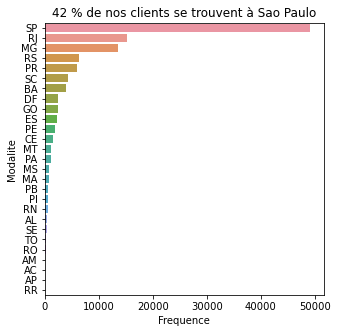

In [340]:
plt.figure(figsize=(5,5))
sns.barplot(y='Modalite',x='Frequence',data=df5.sort_values('Frequence',ascending=False))
plt.title('42 % de nos clients se trouvent à Sao Paulo')

In [570]:
dataFinal.shape

(116577, 19)

In [571]:
dataFinal.head()

,customer_id,customer_unique_id,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_delivered_customer_date,Délai_livraison,order_item_id,product_id,price,freight_value,product_category_name_english,payment_sequential,payment_type,payment_installments,payment_value,review_score
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-25 10:35:35,8 days 19:30:00,1.0,a9516a079e37a9c9c36b9b78b10169e8,124.99,21.88,OFFICE,1.0,credit_card,2.0,146.87,4
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,sao bernardo do campo,SP,29150127e6685892b6eab3eec79f59c7,delivered,2018-01-12 20:48:24,2018-01-29 12:41:19,16 days 15:52:55,1.0,4aa6014eceb682077f9dc4bffebc05b0,289.00,46.48,APPLIANCES,1.0,credit_card,8.0,335.48,5
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,sao paulo,SP,b2059ed67ce144a36e2aa97d2c9e9ad2,delivered,2018-05-19 16:07:45,2018-06-14 17:58:51,26 days 01:51:06,1.0,bd07b66896d6f1494f5b86251848ced7,139.94,17.79,OFFICE,1.0,credit_card,7.0,157.73,5
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,mogi das cruzes,SP,951670f92359f4fe4a63112aa7306eba,delivered,2018-03-13 16:06:38,2018-03-28 16:04:25,14 days 23:57:47,1.0,a5647c44af977b148e0a3a4751a09e2e,149.94,23.36,OFFICE,1.0,credit_card,1.0,173.30,5
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,campinas,SP,6b7d50bd145f6fc7f33cebabd7e49d0f,delivered,2018-07-29 09:51:30,2018-08-09 20:55:48,11 days 11:04:18,1.0,9391a573abe00141c56e38d84d7d5b3b,230.00,22.25,HOME,1.0,credit_card,8.0,252.25,5


## Choix des commandes délivrés 

In [125]:
#Nous allons prendre que les commandes délivrés pour la suite de notre étude
dataFinal.shape

(116577, 19)

In [126]:
dataFinal['order_status'].value_counts()

delivered      114063
shipped          1225
canceled          553
invoiced          364
processing        362
unavailable         7
approved            3
Name: order_status, dtype: int64

In [127]:
df7=pd.DataFrame({'Modalite':dataFinal['order_status'].value_counts().index,'Frequence':dataFinal['order_status'].value_counts().values})

In [128]:
import plotly
import plotly.graph_objs as go
# mode offline
plotly.offline.init_notebook_mode()
plt.figure()
fig = go.Figure([go.Bar(x=df7['Modalite'], y=df7['Frequence'],text=df7['Frequence'],
            textposition='auto')])
fig.update_layout(title_text='97 % des commandes sont délivrés')
fig.show()

<Figure size 432x288 with 0 Axes>

Text(0.5, 1.0, 'On a environ 98% des commandes livrés')

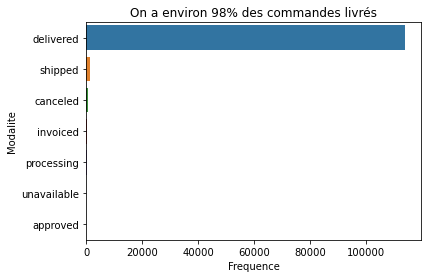

In [575]:
plt.figure()
sns.barplot(y='Modalite',x='Frequence',data=df7.sort_values('Frequence',ascending=False))
plt.title('On a environ 98% des commandes livrés')

In [132]:
dataFinal=dataFinal.query("order_status=='delivered'")

In [133]:
dataFinal.shape

(114063, 19)

In [134]:
dataFinal['customer_unique_id'].unique().shape

(92075,)

In [135]:
dataFinal.select_dtypes('object').columns

Index(['customer_id', 'customer_unique_id', 'customer_city', 'customer_state',
       'order_id', 'order_status', 'product_id',
       'product_category_name_english', 'payment_type'],
      dtype='object')

## Categorie de produit 

In [586]:
dataFinal['product_category_name_english'].value_counts()

HOME            22106
ELECTRONICS     17463
BEAUTE          16476
SPORT           10674
APPLIANCES       9026
FASHION          8835
JARDIN_PET       6520
ART              5493
OFFICE           5051
AUTO             4302
AUTRE            4243
CONSTRUCTION     2707
FOOD_DRINK       1167
Name: product_category_name_english, dtype: int64

In [587]:
df7=pd.DataFrame({'Modalite':dataFinal['product_category_name_english'].value_counts().index,'Frequence':dataFinal['product_category_name_english'].value_counts().values})

Text(0.5, 1.0, 'La categorie de produit la plus vendue est la maison')

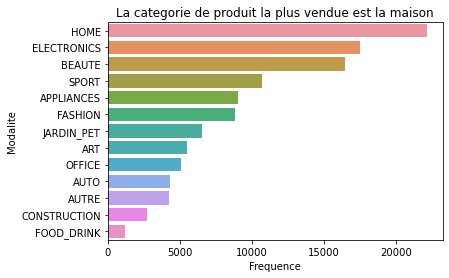

In [588]:
plt.figure()
sns.barplot(y='Modalite',x='Frequence',data=df7.sort_values('Frequence',ascending=False))
plt.title('La categorie de produit la plus vendue est la maison')

## Type de paiement 

In [589]:
dataFinal['payment_type'].value_counts()

credit_card    84170
boleto         22196
voucher         6067
debit_card      1630
Name: payment_type, dtype: int64

In [590]:
df7=pd.DataFrame({'Modalite':dataFinal['payment_type'].value_counts().index,'Frequence':dataFinal['payment_type'].value_counts().values})

Text(0.5, 1.0, 'Les clients payent en carte bancaire le plus souvent et des promos')

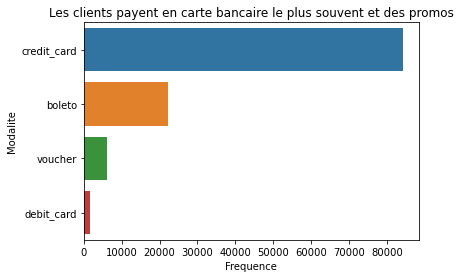

In [591]:
plt.figure()
sns.barplot(y='Modalite',x='Frequence',data=df7.sort_values('Frequence',ascending=False))
plt.title('Les clients payent en carte bancaire le plus souvent et des promos')

# Analyse exploratoire 2

In [593]:
dataFinal.describe()

,Délai_livraison,order_item_id,price,freight_value,payment_sequential,payment_installments,payment_value,review_score
count,114063,114063.000000,114063.000000,114063.000000,114063.000000,114063.000000,114063.00000,114063.000000
mean,11 days 05:56:04.530969727,1.197487,119.999146,20.010193,1.090494,2.946451,172.12434,4.067384
std,148 days 01:38:15.350876200,0.703143,182.349686,15.726501,0.684495,2.781652,266.08983,1.357693
min,-17714 days +01:54:05,1.000000,0.850000,0.000000,1.000000,1.000000,0.00000,1.000000
25%,6 days 17:59:48,1.000000,39.900000,13.080000,1.000000,1.000000,60.96000,4.000000
50%,10 days 04:48:56,1.000000,74.900000,16.320000,1.000000,2.000000,108.07000,5.000000
75%,15 days 13:16:51.500000,1.000000,133.000000,21.190000,1.000000,4.000000,189.37000,5.000000
max,209 days 15:05:12,21.000000,6735.000000,409.680000,26.000000,24.000000,13664.08000,5.000000


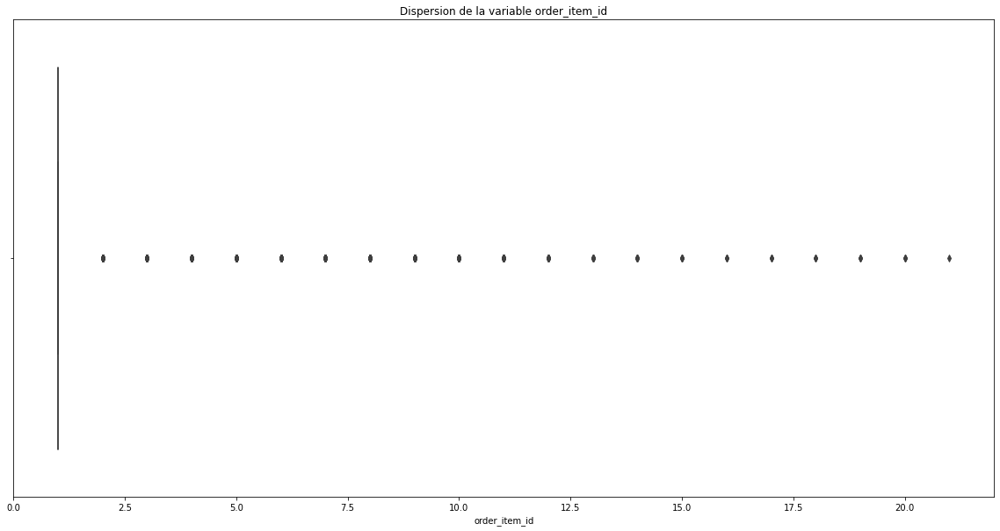

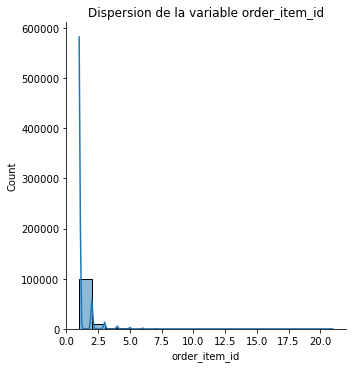

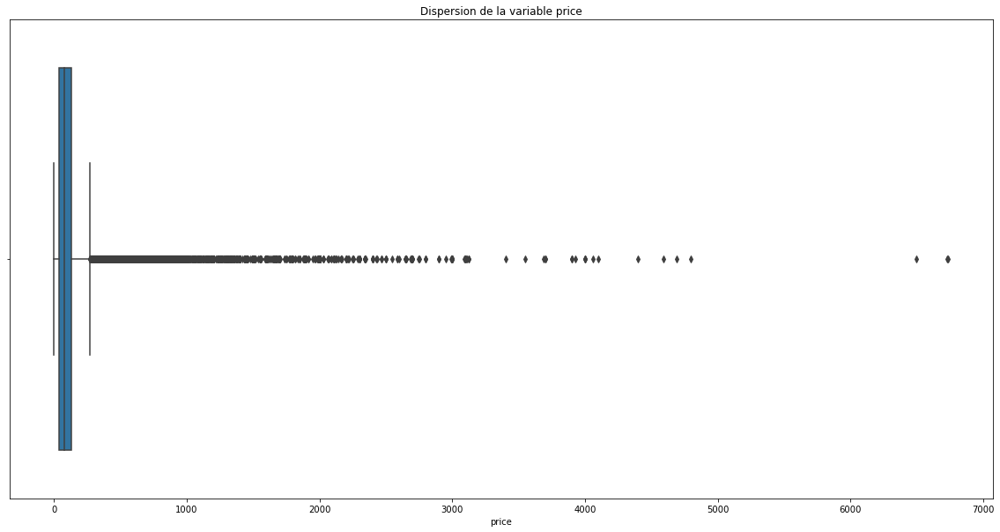

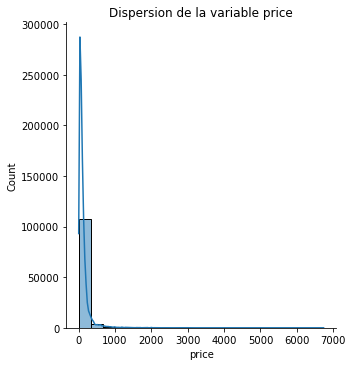

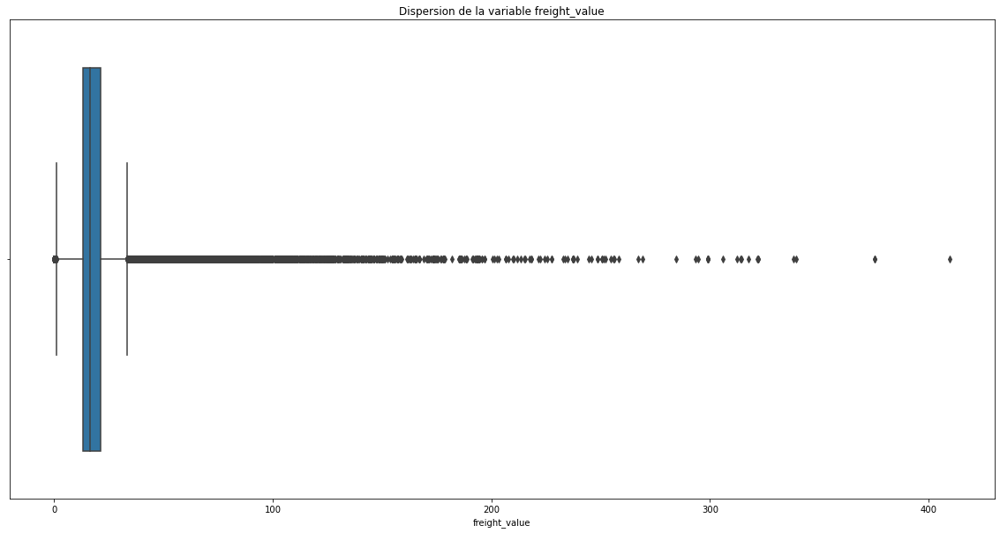

...

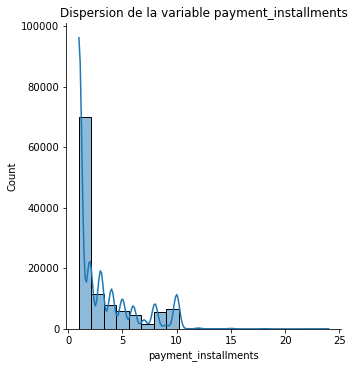

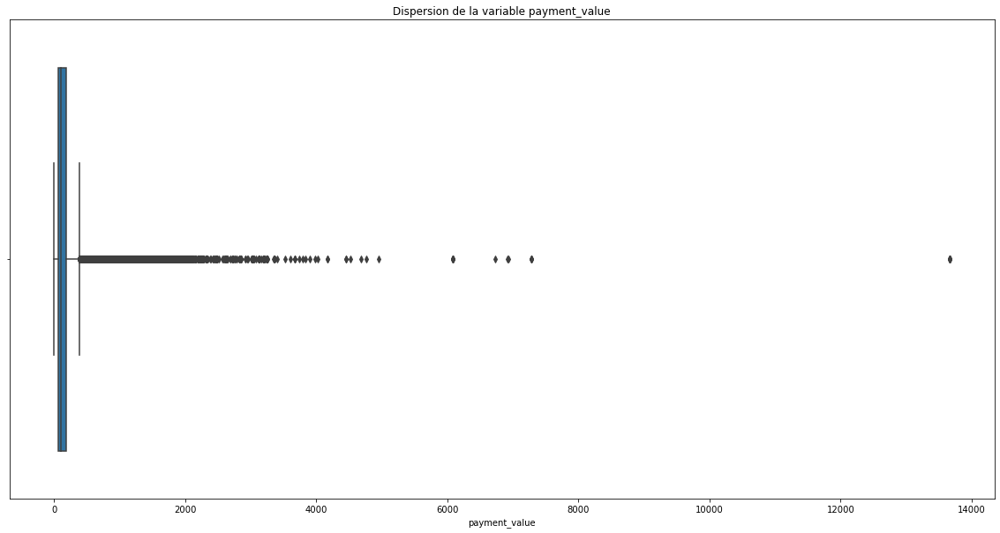

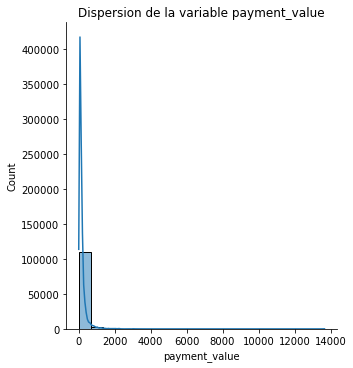

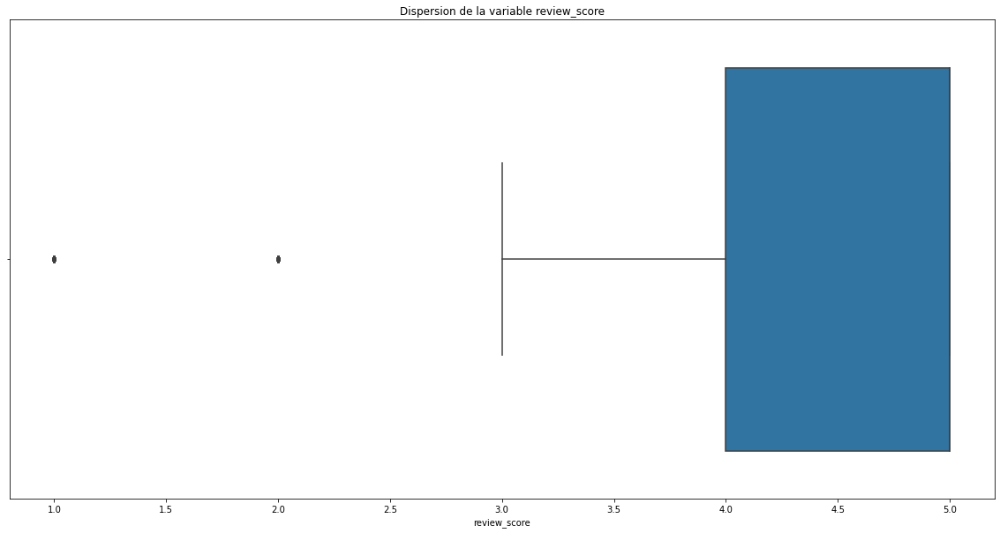

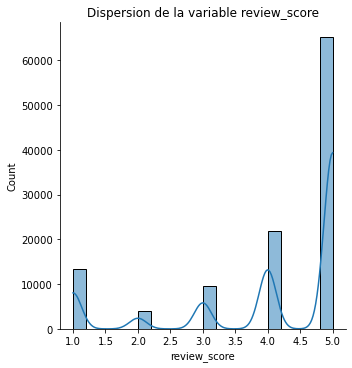

In [594]:
for col in dataFinal.select_dtypes(['float64','int64']).columns:
    TraceGraphique(dataFinal,col)

<AxesSubplot:>

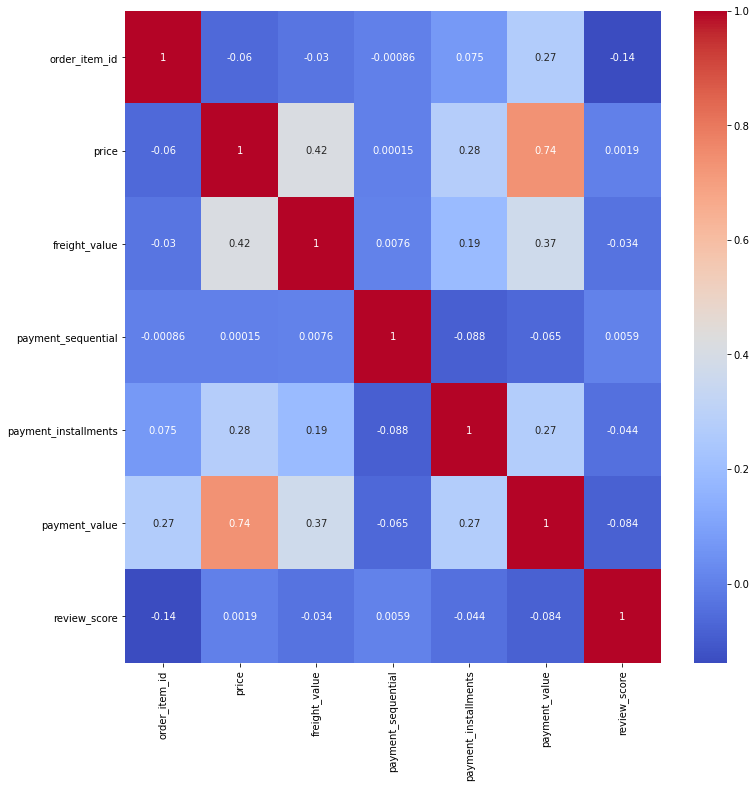

In [658]:
cor=dataFinal.corr()
fig,ax=plt.subplots(figsize=(12,12))
sns.heatmap(cor,annot=True,ax=ax,cmap='coolwarm')
#la corrrélation entre le prix d'un article et le paiement est de 0.73

In [595]:
dataFinal.shape

(114063, 19)

In [596]:
dataFinal.select_dtypes('object').columns

Index(['customer_id', 'customer_unique_id', 'customer_city', 'customer_state',
       'order_id', 'order_status', 'product_id',
       'product_category_name_english', 'payment_type'],
      dtype='object')

In [597]:
#existe til un lien avec le type de paiement et la catégorie du produit 
t=pd.pivot_table(dataFinal[['payment_type','product_category_name_english']],index='product_category_name_english',columns='payment_type',aggfunc=len,dropna=False,margins=True,margins_name='Total')


In [598]:
t

payment_type,boleto,credit_card,debit_card,voucher,Total
product_category_name_english,,,,,
APPLIANCES,1614,6696,138,578,9026
ART,1029,4149,70,245,5493
AUTO,828,3215,69,190,4302
AUTRE,803,3137,40,263,4243
BEAUTE,2946,12520,239,771,16476
CONSTRUCTION,542,2026,41,98,2707
ELECTRONICS,4187,12190,324,762,17463
FASHION,1538,6733,96,468,8835
FOOD_DRINK,239,853,36,39,1167


In [600]:
from scipy.stats import chi2_contingency
st_chi2, st_p, st_dof, st_exp = chi2_contingency(t)

In [601]:
st_p 
# H0 independance 
#H1 dependance 
#pvalue < 0.05 on accepte H1

1.6211244914020212e-101

# Analyse quantitative et qualitative

In [602]:
dataFinal.select_dtypes('object').columns

Index(['customer_id', 'customer_unique_id', 'customer_city', 'customer_state',
       'order_id', 'order_status', 'product_id',
       'product_category_name_english', 'payment_type'],
      dtype='object')

In [603]:
dataFinal.select_dtypes(['int64','float64']).columns

Index(['order_item_id', 'price', 'freight_value', 'payment_sequential',
       'payment_installments', 'payment_value', 'review_score'],
      dtype='object')

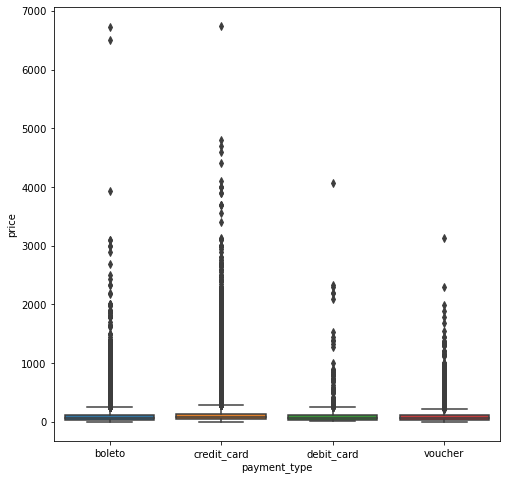

In [667]:
Trace_Box(dataFinal,'price','payment_type')

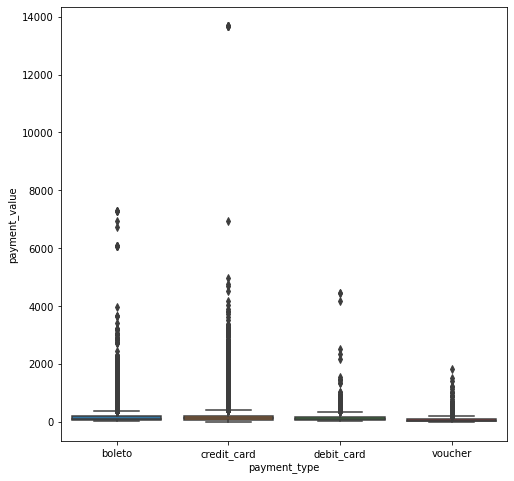

In [668]:
Trace_Box(dataFinal,'payment_value','payment_type')

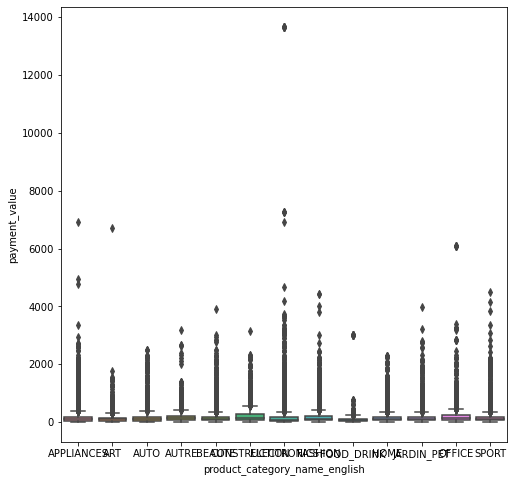

In [669]:
Trace_Box(dataFinal,'payment_value','product_category_name_english')

<Figure size 1440x720 with 0 Axes>

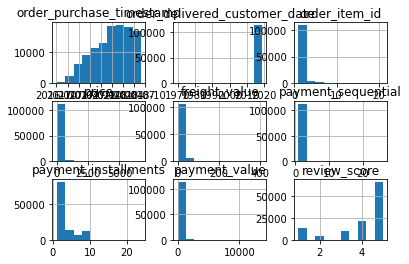

In [670]:
plt.figure(figsize=(20,10))
dataFinal.hist();

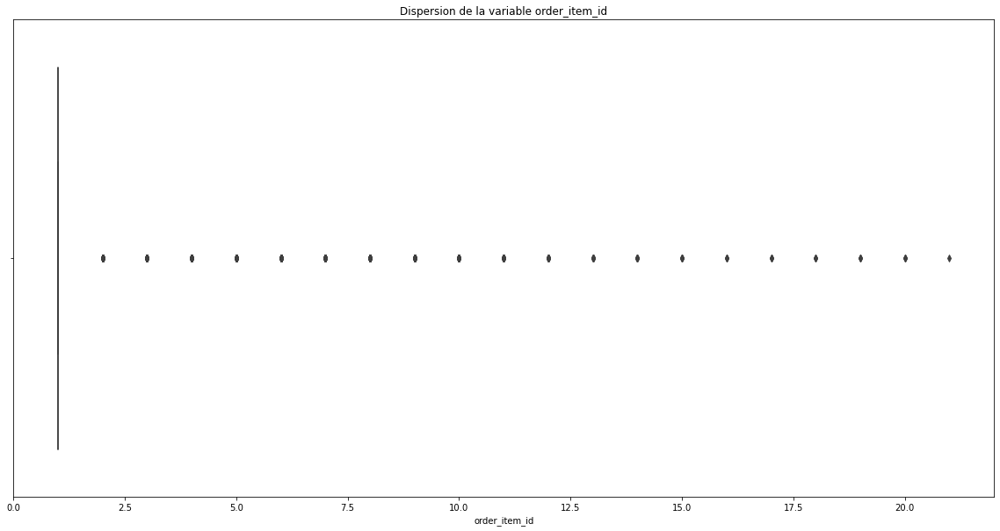

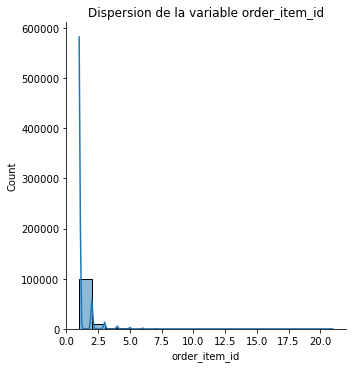

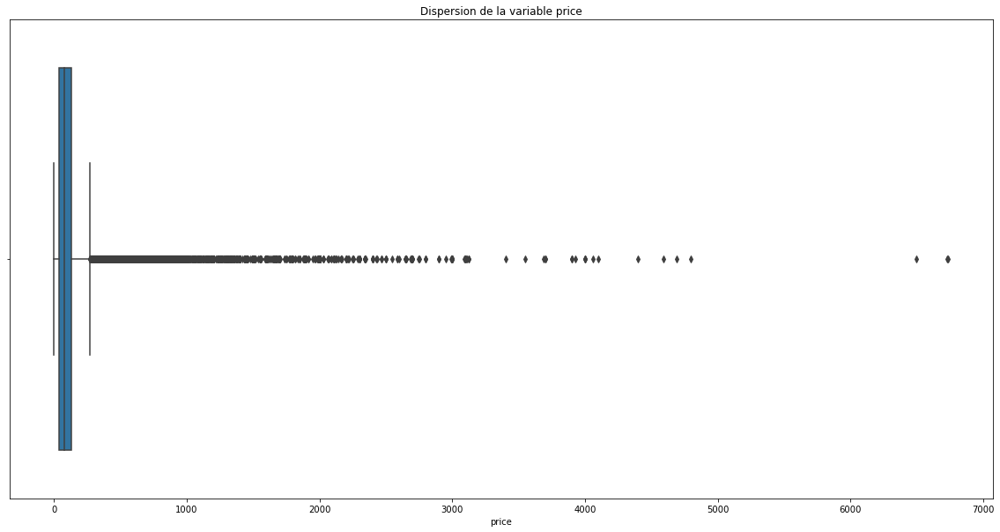

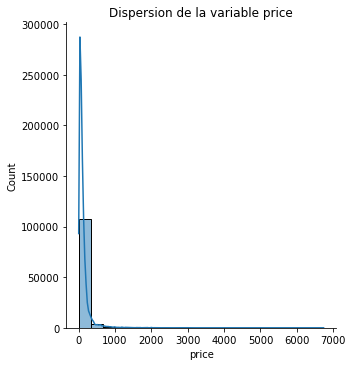

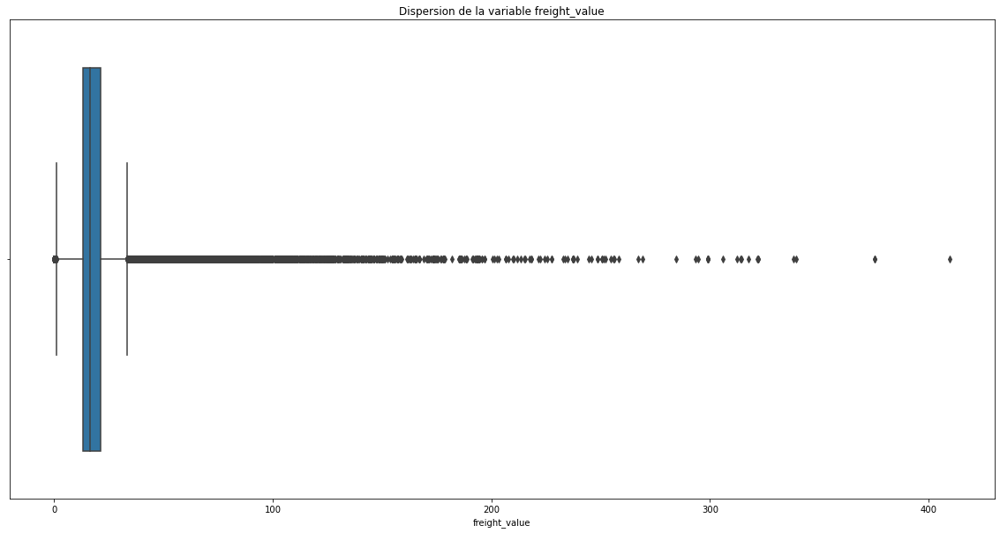

...

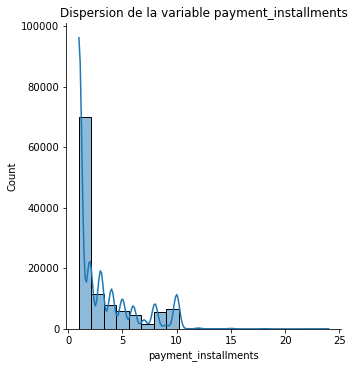

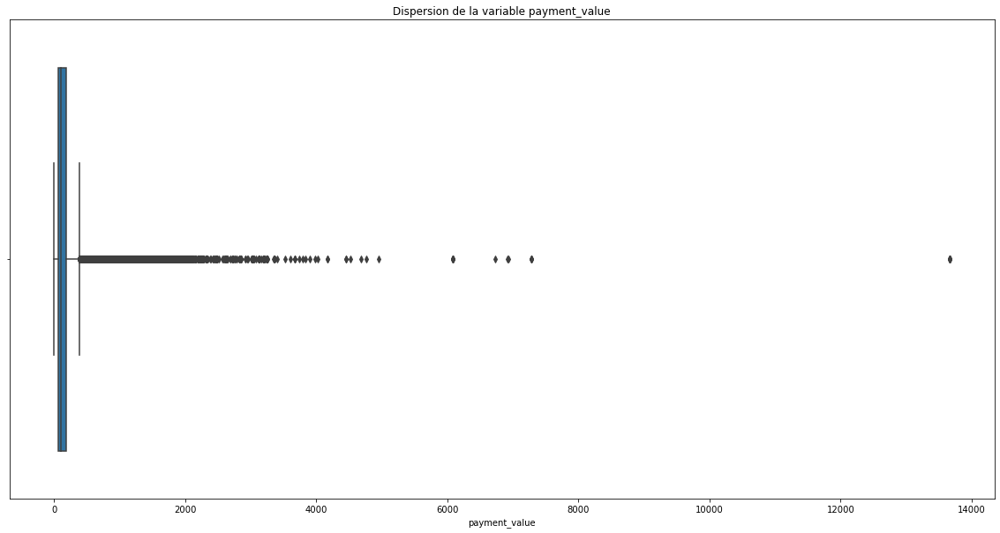

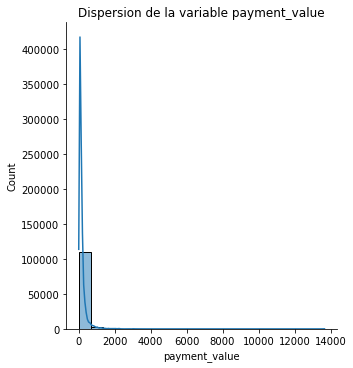

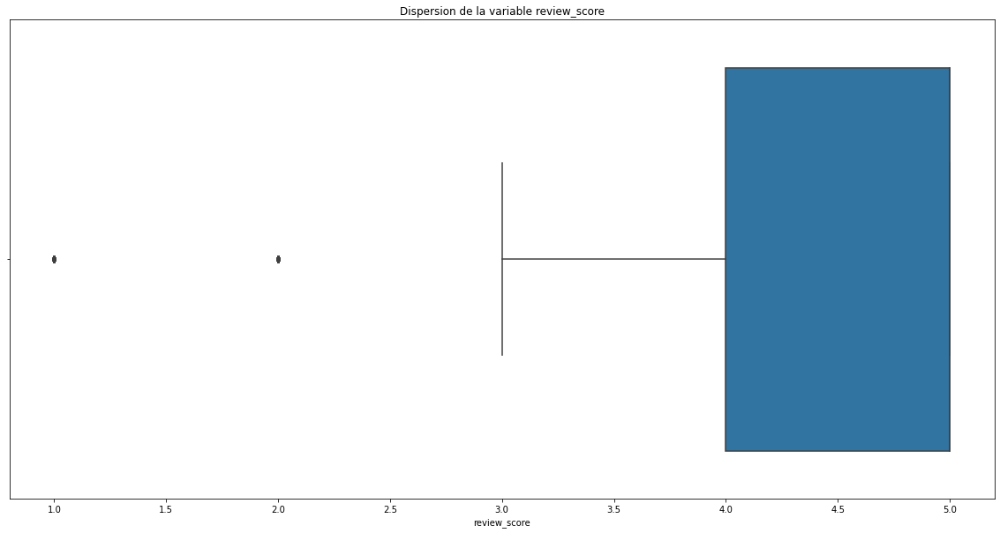

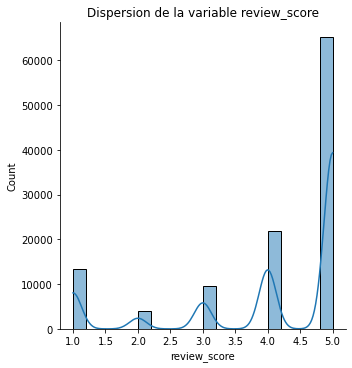

In [671]:
for col in dataFinal.select_dtypes(['float64','int64']).columns:
    TraceGraphique(dataFinal,col)

# Kruskal wallis 

In [319]:
from pingouin import kruskal
kruskal(data=dataFinal,dv='price',between='product_category_name_english')

,Source,ddof1,H,p-unc
Kruskal,product_category_name_english,12,4762.574017,0.0


C:\Users\soule\anaconda3\lib\site-packages\outdated\utils.py:14: OutdatedPackageWarning:

The package outdated is out of date. Your version is 0.2.0, the latest is 0.2.1.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.

C:\Users\soule\anaconda3\lib\site-packages\outdated\utils.py:14: OutdatedPackageWarning:

The package pingouin is out of date. Your version is 0.3.11, the latest is 0.3.12.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.



In [320]:
from pingouin import kruskal
kruskal(data=dataFinal,dv='price',between='payment_type')

,Source,ddof1,H,p-unc
Kruskal,payment_type,3,794.040692,8.485196e-172


In [605]:
dataFinal['customer_id'].unique().shape

(95123,)

In [604]:
dataFinal['customer_unique_id'].unique().shape

(92075,)

In [676]:
dataFinal.columns

Index(['customer_id', 'customer_unique_id', 'customer_city', 'customer_state',
       'order_id', 'order_status', 'order_purchase_timestamp',
       'order_delivered_customer_date', 'Délai_livraison', 'order_item_id',
       'product_id', 'price', 'freight_value', 'product_category_name_english',
       'payment_sequential', 'payment_type', 'payment_installments',
       'payment_value', 'review_score'],
      dtype='object')

In [323]:
d=dataFinal.groupby('customer_unique_id')['customer_id'].count()

In [678]:
d #c'est le nombre de commandes par client

customer_unique_id
0000366f3b9a7992bf8c76cfdf3221e2    1
0000b849f77a49e4a4ce2b2a4ca5be3f    1
0000f46a3911fa3c0805444483337064    1
0000f6ccb0745a6a4b88665a16c9f078    1
0004aac84e0df4da2b147fca70cf8255    1
                                   ..
fffcf5a5ff07b0908bd4e2dbc735a684    2
fffea47cd6d3cc0a88bd621562a9d061    1
ffff371b4d645b6ecea244b27531430a    1
ffff5962728ec6157033ef9805bacc48    1
ffffd2657e2aad2907e67c3e9daecbeb    1
Name: customer_id, Length: 92075, dtype: int64

# Exportation base finale

In [679]:
dataFinal.columns

Index(['customer_id', 'customer_unique_id', 'customer_city', 'customer_state',
       'order_id', 'order_status', 'order_purchase_timestamp',
       'order_delivered_customer_date', 'Délai_livraison', 'order_item_id',
       'product_id', 'price', 'freight_value', 'product_category_name_english',
       'payment_sequential', 'payment_type', 'payment_installments',
       'payment_value', 'review_score'],
      dtype='object')

In [680]:
dataFinal.shape

(114063, 19)

les colonnes vides sont:




[]

,customer_id,customer_unique_id,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_delivered_customer_date,Délai_livraison,order_item_id,product_id,price,freight_value,product_category_name_english,payment_sequential,payment_type,payment_installments,payment_value,review_score
number of missing values,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
number of values,114063,114063,114063,114063,114063,114063,114063,114063,114063,114063,114063,114063,114063,114063,114063,114063,114063,114063,114063
fill_rate,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


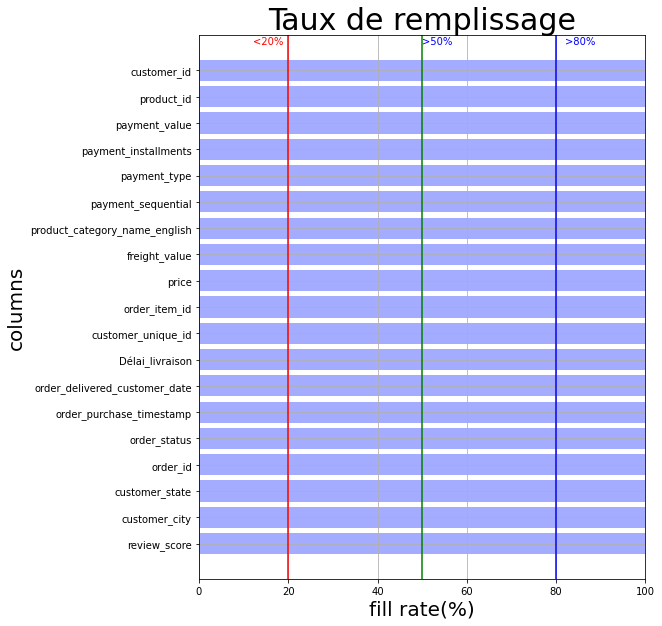

In [681]:
TraceValeurMissing(dataFinal)

In [324]:
dataFinal=dataFinal.reset_index(drop=True)

In [326]:
dataFinal.describe()

,Délai_livraison,order_item_id,price,freight_value,payment_sequential,payment_installments,payment_value,review_score
count,114063,114063.000000,114063.000000,114063.000000,114063.000000,114063.000000,114063.00000,114063.000000
mean,11 days 05:56:04.530969727,1.197487,119.999146,20.010193,1.090494,2.946451,172.12434,4.067384
std,148 days 01:38:15.350876200,0.703143,182.349686,15.726501,0.684495,2.781652,266.08983,1.357693
min,-17714 days +01:54:05,1.000000,0.850000,0.000000,1.000000,1.000000,0.00000,1.000000
25%,6 days 17:59:48,1.000000,39.900000,13.080000,1.000000,1.000000,60.96000,4.000000
50%,10 days 04:48:56,1.000000,74.900000,16.320000,1.000000,2.000000,108.07000,5.000000
75%,15 days 13:16:51.500000,1.000000,133.000000,21.190000,1.000000,4.000000,189.37000,5.000000
max,209 days 15:05:12,21.000000,6735.000000,409.680000,26.000000,24.000000,13664.08000,5.000000


In [325]:
dataFinal.to_csv('BaseNettoye.csv')